# <span style="color:blue">GHP-2-2 and PAHAT_1 - InDels Analysis</span>

#### Original Data Extracted from VCF File

In [1]:
from VCFtoTable import *
from GTtable import *
from GTplots import *
from GTplot import *
from BarPlots import *
from CTbarPlots import *
from variant_hist import*
from stats import *
from FilterVCF import *
from GTfilter import*
from CTguide import *

In [2]:
vcf_sorghum = '/home/anibal/genome_files/freebayes~bwa~GCF_000003195.3_Sorghum_bicolor_NCBIv3~all_samples~filtered-default.vcf'

In [3]:
samples_all, vcf_df, chrom_len = VCFtoTable(vcf_sorghum)

In [4]:
samples_all

array(['GHP-2-2', 'PAHAT_1', 'PAHAT_2'], dtype=object)

In [5]:
progenitor = 'PAHAT_1'
mutant = 'GHP-2-2'
samples = [progenitor, mutant]
samples

['PAHAT_1', 'GHP-2-2']

In [6]:
vcf_df

,CHROM,POS,REF,ALT,QUAL,DP,GHP-2-2_DP,PAHAT_1_DP,PAHAT_2_DP,GHP-2-2_GT,PAHAT_1_GT,PAHAT_2_GT,GHP-2-2_AD,PAHAT_1_AD,PAHAT_2_AD,AN,TYPE
0,NC_008360.1,3598,GAAAAAACT,GAAAAAAAACT,2072.229980,1771,187,854,730,0/0,0/1,0/1,187/0,714/140,600/128,6,ins
1,NC_008360.1,3788,AT,AG,41349.500000,1477,189,694,594,0/0,1/1,1/1,186/3,2/692,4/589,6,snp
2,NC_008360.1,4068,T,A,38302.101562,1387,177,637,573,0/0,1/1,1/1,176/1,9/628,5/568,6,snp
3,NC_008360.1,7055,G,A,7958.569824,351,70,167,114,0/0,1/1,1/1,69/1,3/164,1/113,6,snp
4,NC_008360.1,9183,G,A,246.141006,26,11,6,9,0/0,1/1,0/1,11/0,0/6,1/8,6,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2276907,NC_012879.2,61191248,GCCA,ACCG,27.908600,71,16,22,33,0/0,0/1,0/1,15/1,18/4,28/5,6,complex
2276908,NC_012879.2,61191286,C,T,13.749700,70,19,20,31,0/0,0/1,0/1,18/1,16/4,27/4,6,snp
2276909,NC_012879.2,61191293,G,C,23.474300,65,17,20,28,0/0,0/1,0/1,16/1,16/4,24/4,6,snp
2276910,NC_012879.2,61233448,GTTTAGGGTTAAGGGT,GTTTTAGGGTT,432.449005,139,15,68,56,0/1,0/1,0/1,9/3,42/16,31/13,6,complex


In [7]:
chrom_len

,LEN
CHROM,
NC_012870.2,80884392
NC_012871.2,77742459
NC_012872.2,74386277
NC_012873.2,68658214
NC_012874.2,71854669
NC_012875.2,61277060
NC_012876.2,65505356
NC_012877.2,62686529
NC_012878.2,59416394


## <span style="color:blue"> PART 0: Raw </span>

#### Contingency Table - RAW - All Chromosomes - (No 0/0, 0/1, 1/1 Filtered)

In [8]:
contingency_table_0 = contingency_table(samples, vcf_df, 'all')


Contingency Table - Chromosome all

                 GHP-2-2_GT                       
                        0/0     0/1     1/1  other
PAHAT_1_GT 0/0         7586  212925  620457  68933
           0/1       119419  225957   42168  68933
           1/1       307284   54103  618080  68933
           other      68933   68933   68933  68933


#### GT Plot - RAW - All Chromosomes - (No 0/0, 1/1, 'Other' GTs Filtered)

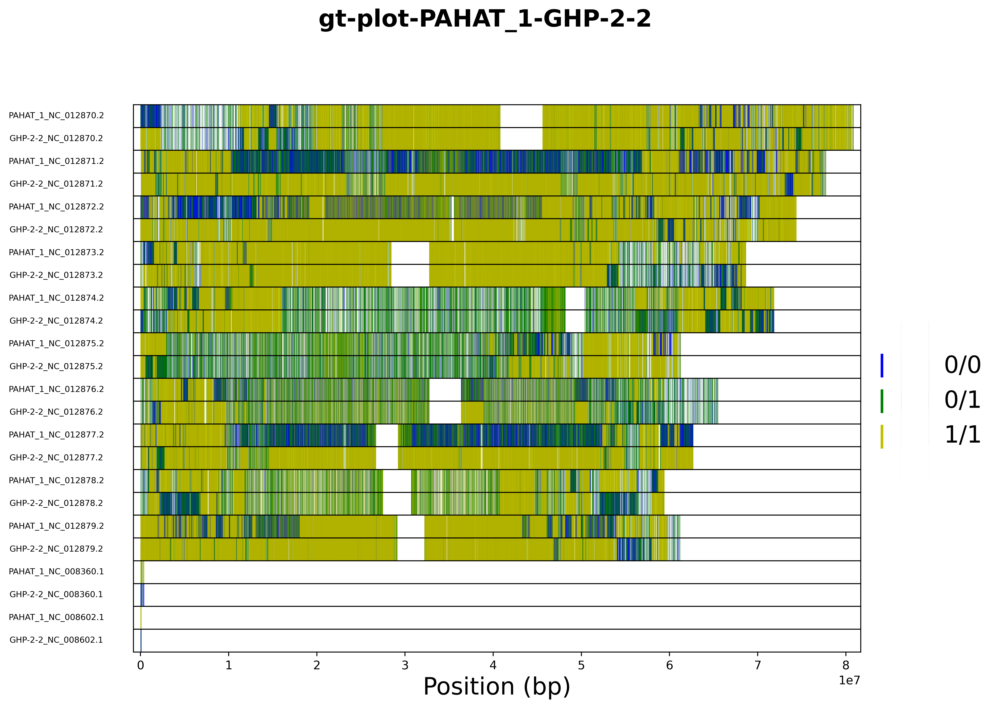

In [9]:
plt.close('all')
GTplot(samples, vcf_df, chrom_len)

#### Histograms - `DP`, `QUAL`, `TYPE` and `GT` Attributes - All Chromosomes - Unfiltered

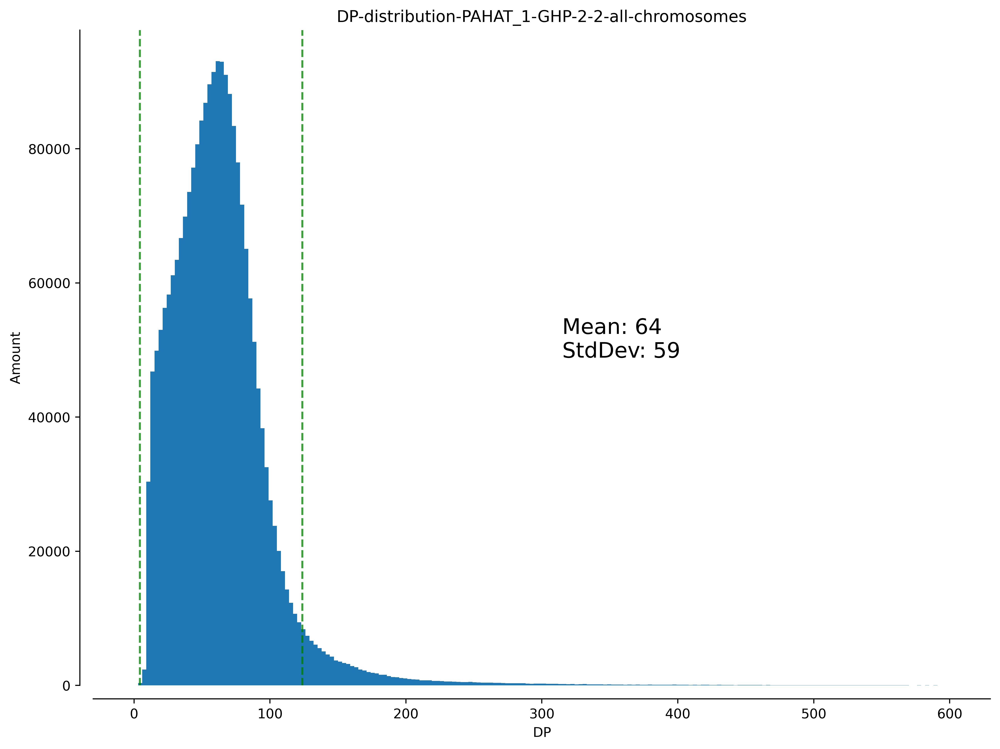

In [10]:
plot_variant_hist(samples, vcf_df, 'all', 'DP', bins=200, MSTD=True, xmax=600)

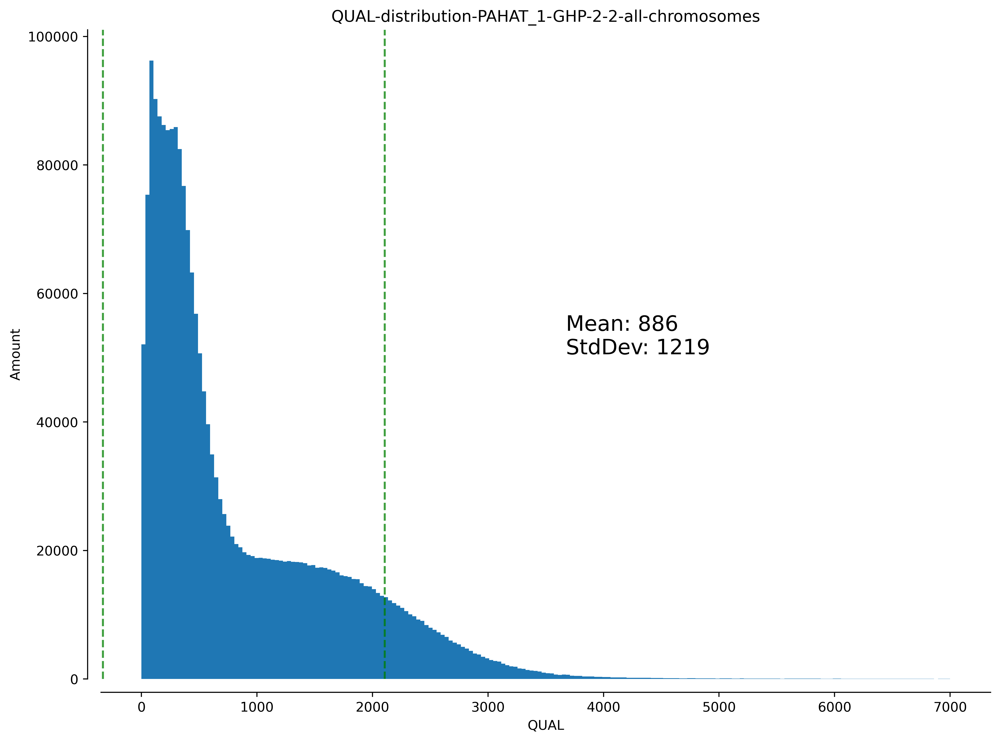

In [11]:
plot_variant_hist(samples, vcf_df, 'all', 'QUAL', bins=200,  MSTD=True, xmax=7000)

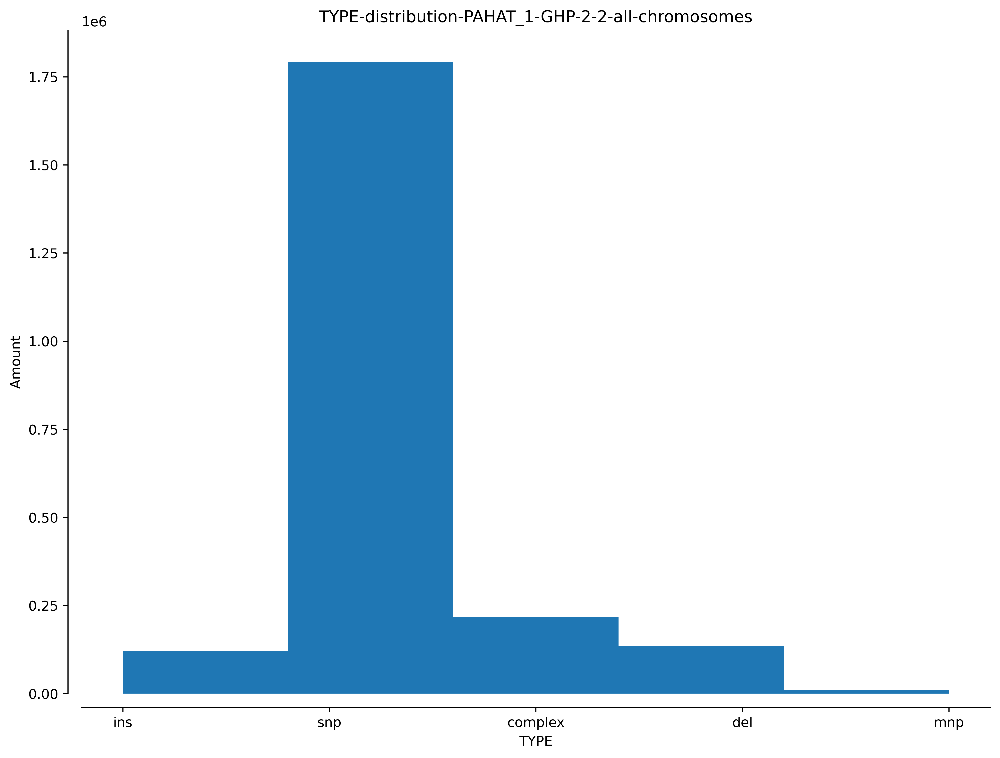

In [12]:
plot_variant_hist(samples, vcf_df, 'all', 'TYPE', bins=5)

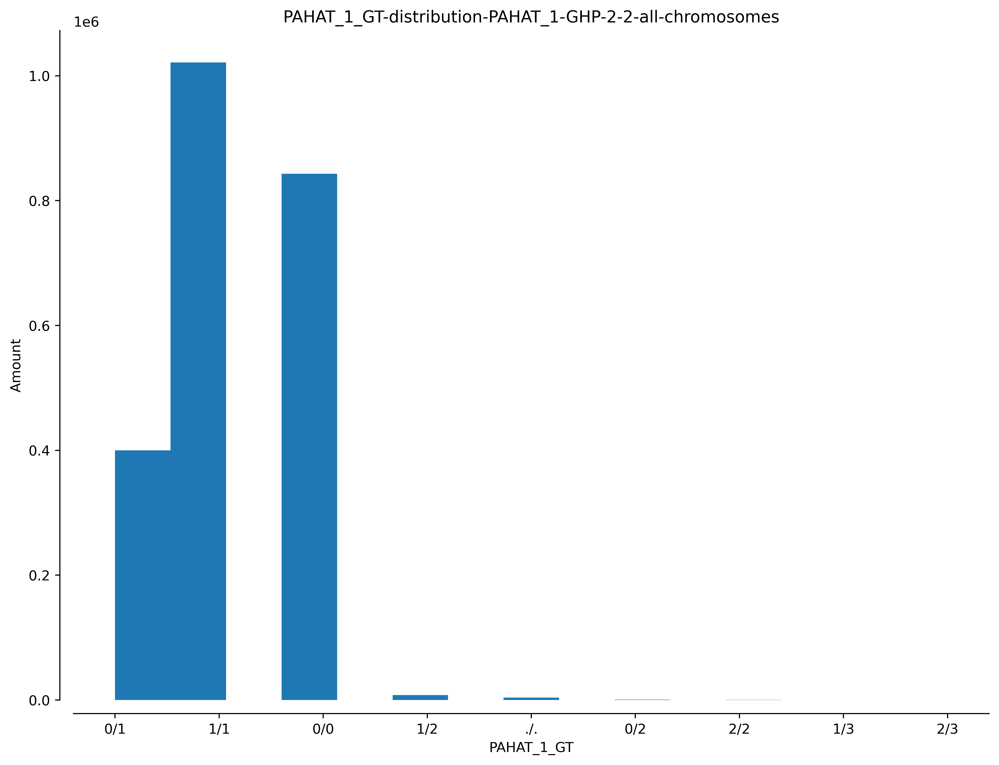

In [13]:
plot_variant_hist(samples, vcf_df, 'all', 'PAHAT_1_GT', bins=15)

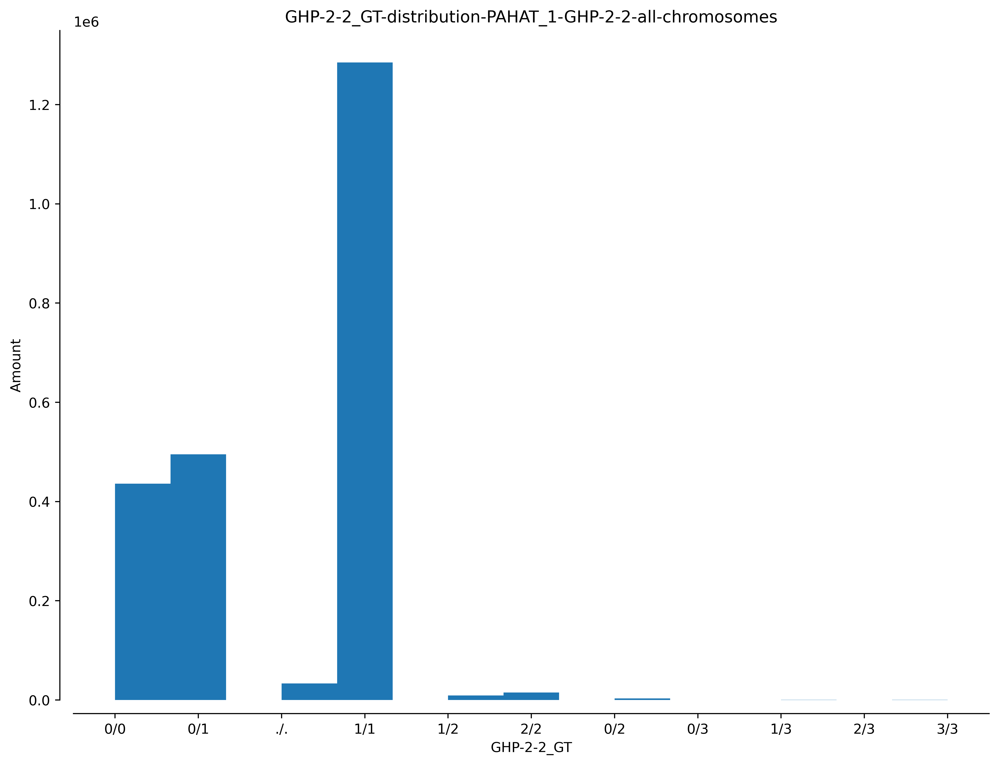

In [14]:
plot_variant_hist(samples, vcf_df, 'all', 'GHP-2-2_GT', bins=15)

#### Stacked Bar Plots - RAW

In [15]:
ct_guide()

Mutant              
                    0/0 0/1 1/1 other
Progenitor 0/0        a   b   c      
           0/1        d   e   f      
           1/1        g   h   i      
           other                    j

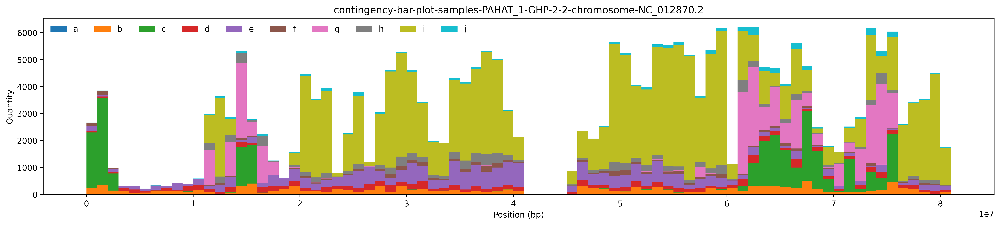

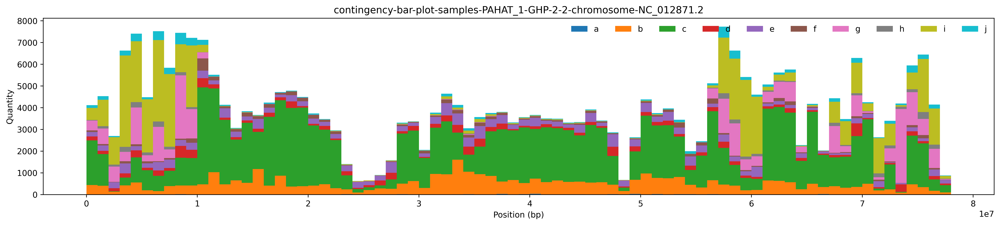

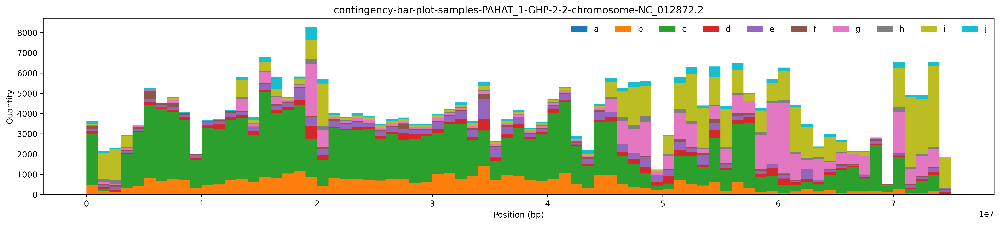

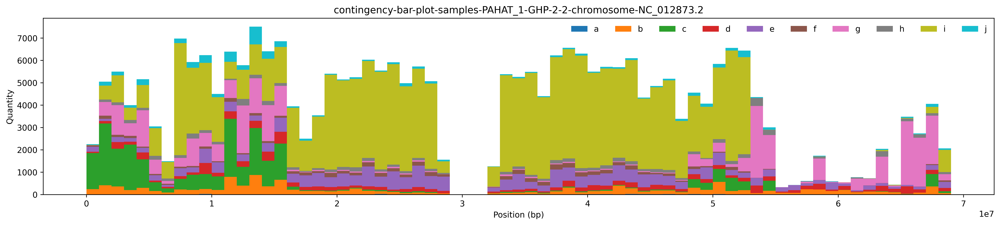

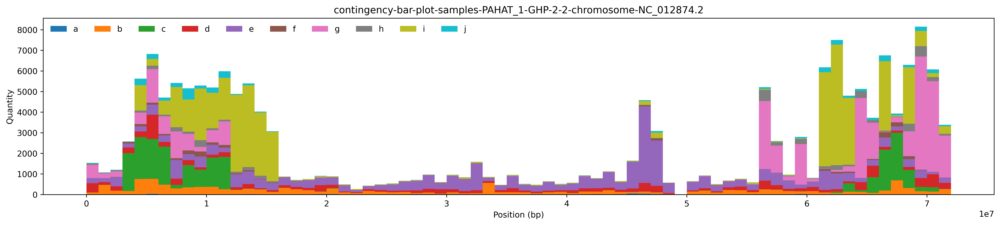

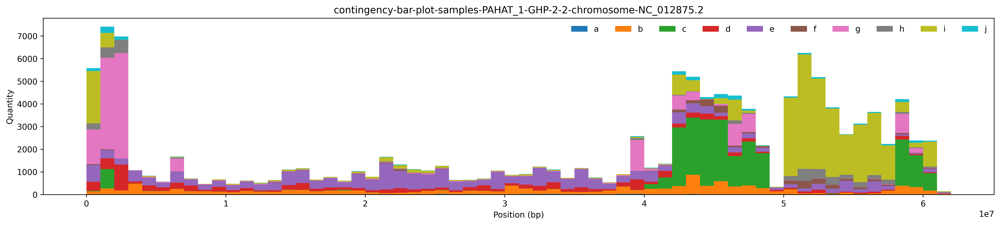

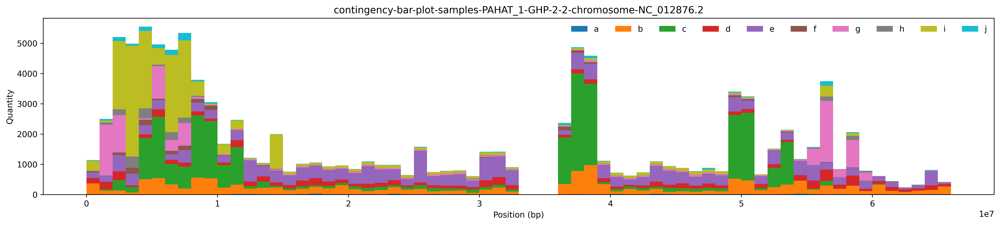

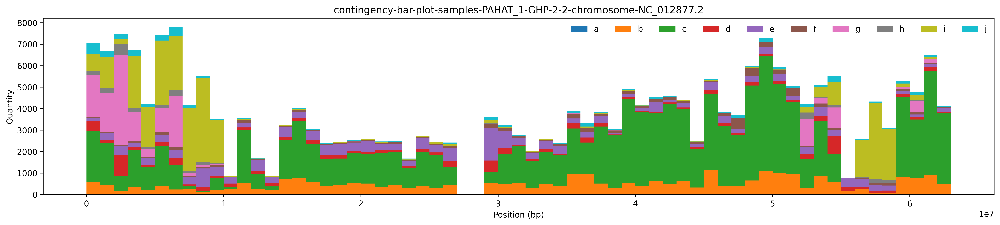

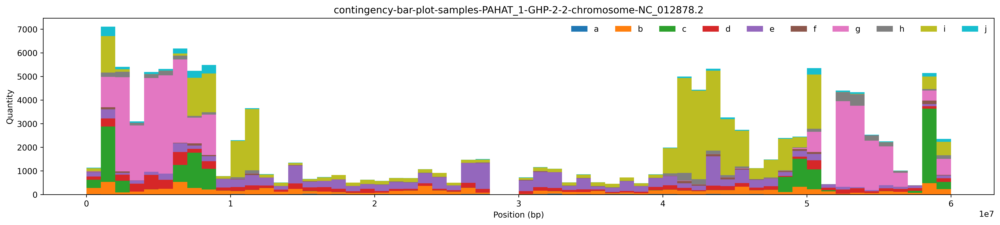

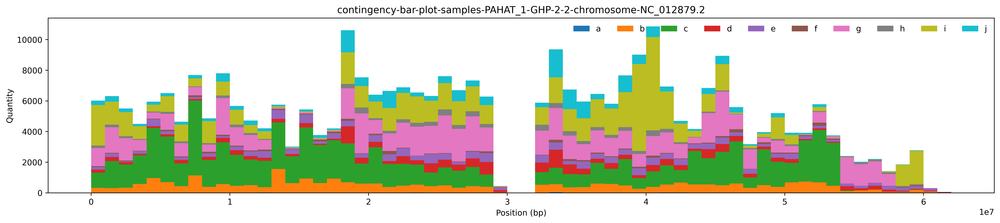

In [16]:
plt.close('all')
window_size = 1000000
CTbarPlots(samples, vcf_df, chrom_len, window_size)

## <span style="color:blue"> PART 1: Filter Out Mitochondria and Chloroplast Chromosomes </span>

#### Drop Mitochrondria and Chloroplast Chromosomes from `vcf_df` and `chrom_len`

In [17]:
drop_mito_chloro = "CHROM != NC_008360.1, CHROM != NC_008602.1"
vcf_df_00 = filter_vcf(vcf_df, drop_mito_chloro)
vcf_df_00

,CHROM,POS,REF,ALT,QUAL,DP,GHP-2-2_DP,PAHAT_1_DP,PAHAT_2_DP,GHP-2-2_GT,PAHAT_1_GT,PAHAT_2_GT,GHP-2-2_AD,PAHAT_1_AD,PAHAT_2_AD,AN,TYPE
0,NC_012870.2,91,C,A,113.435997,13,-1,5,8,./.,0/1,0/1,./.,2/3,3/5,4,snp
1,NC_012870.2,111,C,A,226.643997,16,-1,6,10,./.,0/1,0/1,./.,2/4,2/8,4,snp
2,NC_012870.2,744,C,A,178.729996,43,8,20,15,1/1,0/0,0/0,0/8,20/0,15/0,6,snp
3,NC_012870.2,871,C,T,499.332001,61,18,28,15,1/1,0/0,0/0,0/18,28/0,15/0,6,snp
4,NC_012870.2,1143,T,G,176.011002,16,9,1,6,1/1,0/0,0/0,0/9,1/0,6/0,6,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2276576,NC_012879.2,61191248,GCCA,ACCG,27.908600,71,16,22,33,0/0,0/1,0/1,15/1,18/4,28/5,6,complex
2276577,NC_012879.2,61191286,C,T,13.749700,70,19,20,31,0/0,0/1,0/1,18/1,16/4,27/4,6,snp
2276578,NC_012879.2,61191293,G,C,23.474300,65,17,20,28,0/0,0/1,0/1,16/1,16/4,24/4,6,snp
2276579,NC_012879.2,61233448,GTTTAGGGTTAAGGGT,GTTTTAGGGTT,432.449005,139,15,68,56,0/1,0/1,0/1,9/3,42/16,31/13,6,complex


In [18]:
mito_chloro = ['NC_008360.1','NC_008602.1']
chrom_len_00 = chrom_len.drop(mito_chloro)
chrom_len_00

,LEN
CHROM,
NC_012870.2,80884392
NC_012871.2,77742459
NC_012872.2,74386277
NC_012873.2,68658214
NC_012874.2,71854669
NC_012875.2,61277060
NC_012876.2,65505356
NC_012877.2,62686529
NC_012878.2,59416394


#### Create Mitochrondria and Chloroplast Variants and Chomosome Length Dataframes

In [19]:
drop_chrom = "CHROM!=NC_012870.2, CHROM!=NC_012871.2, CHROM!=NC_012872.2, CHROM!=NC_012873.2, CHROM!=NC_012874.2, CHROM!=NC_012875.2, CHROM!=NC_012876.2, CHROM!=NC_012877.2, CHROM!=NC_012878.2, CHROM!=NC_012879.2"
vcf_df_mito_chloro = filter_vcf(vcf_df, drop_chrom)
vcf_df_mito_chloro

,CHROM,POS,REF,ALT,QUAL,DP,GHP-2-2_DP,PAHAT_1_DP,PAHAT_2_DP,GHP-2-2_GT,PAHAT_1_GT,PAHAT_2_GT,GHP-2-2_AD,PAHAT_1_AD,PAHAT_2_AD,AN,TYPE
0,NC_008360.1,3598,GAAAAAACT,GAAAAAAAACT,2072.229980,1771,187,854,730,0/0,0/1,0/1,187/0,714/140,600/128,6,ins
1,NC_008360.1,3788,AT,AG,41349.500000,1477,189,694,594,0/0,1/1,1/1,186/3,2/692,4/589,6,snp
2,NC_008360.1,4068,T,A,38302.101562,1387,177,637,573,0/0,1/1,1/1,176/1,9/628,5/568,6,snp
3,NC_008360.1,7055,G,A,7958.569824,351,70,167,114,0/0,1/1,1/1,69/1,3/164,1/113,6,snp
4,NC_008360.1,9183,G,A,246.141006,26,11,6,9,0/0,1/1,0/1,11/0,0/6,1/8,6,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
326,NC_008602.1,111981,CACCCGCAG,CACCTGCAG,294407.000000,13776,4663,4612,4501,0/0,1/1,1/1,4565/87,27/4562,18/4452,6,snp
327,NC_008602.1,115489,AAG,AAA,74523.203125,3835,1330,1119,1386,0/0,1/1,1/1,1296/34,7/1112,12/1371,6,snp
328,NC_008602.1,115682,CA,CC,178725.000000,8256,2511,2814,2931,0/0,1/1,1/1,2504/6,80/2733,47/2880,6,snp
329,NC_008602.1,118002,GGCTGCTACC,GGCAGCTACC,263337.000000,12914,4653,4175,4086,0/0,1/1,1/1,4602/11,27/4071,27/3992,6,snp


In [20]:
mito_chloro_len = chrom_len.loc[mito_chloro]
mito_chloro_len

,LEN
CHROM,
NC_008360.1,468628
NC_008602.1,140754


#### Contingency Table - No Mitochondria/Chloroplast

In [21]:
contingency_table_1 = contingency_table(samples, vcf_df_00, 'all')


Contingency Table - Chromosome all

                 GHP-2-2_GT                       
                        0/0     0/1     1/1  other
PAHAT_1_GT 0/0         7585  212887  620457  68924
           0/1       119369  225903   42168  68924
           1/1       307108   54103  618077  68924
           other      68924   68924   68924  68924


#### GT Plot - No Mitochondria/Chloroplast

In [22]:
# plt.close('all')
# GTplot(samples, vcf_df_00, chrom_len_00)

#### Histograms - `DP`, `QUAL`, `TYPE` and `GT` Attributes - No Mitochondria/Chloroplast

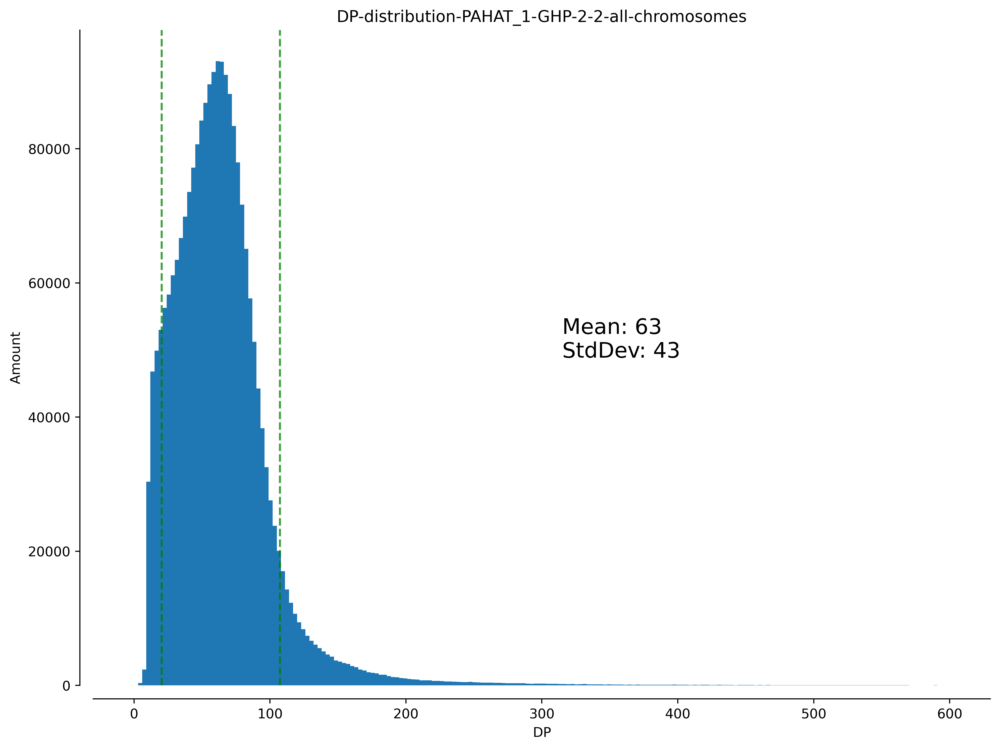

In [23]:
plot_variant_hist(samples, vcf_df_00, 'all', 'DP', bins=200, MSTD=True, xmax=600)

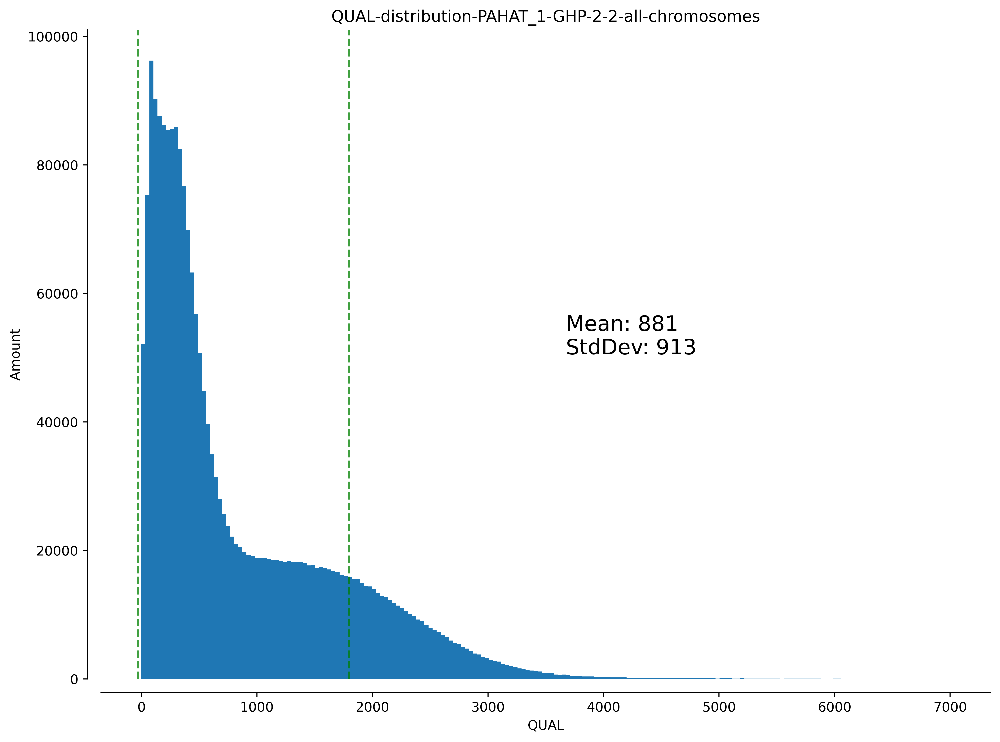

In [24]:
plot_variant_hist(samples, vcf_df_00, 'all', 'QUAL', bins=200,  MSTD=True, xmax=7000)

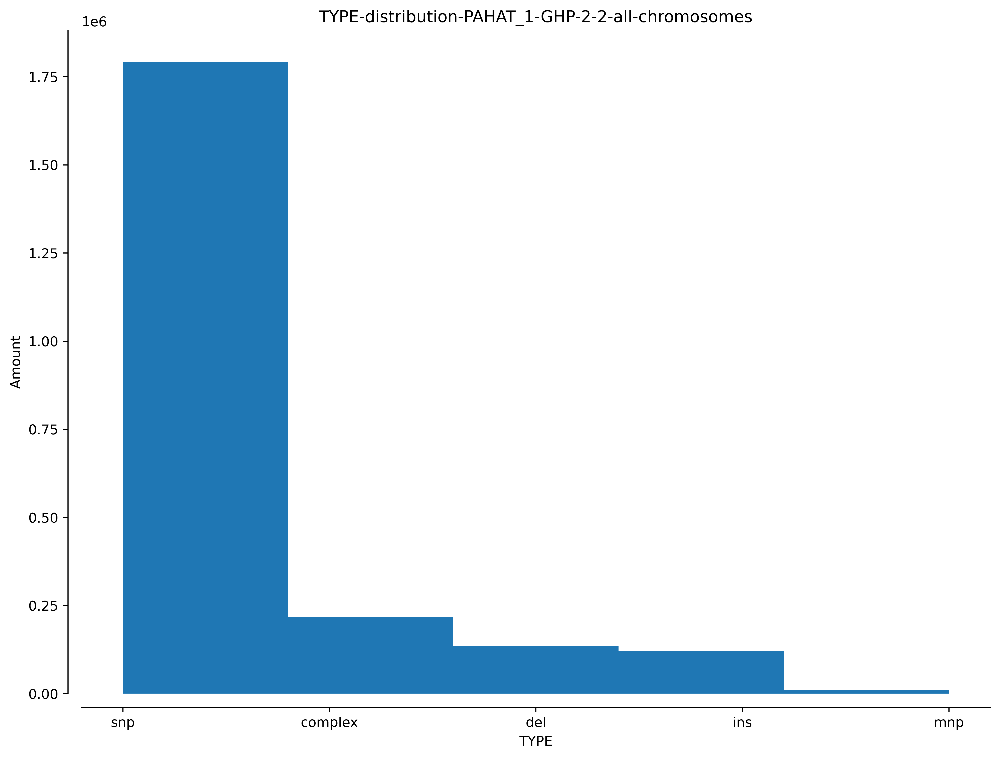

In [25]:
plot_variant_hist(samples, vcf_df_00, 'all', 'TYPE', bins=5)

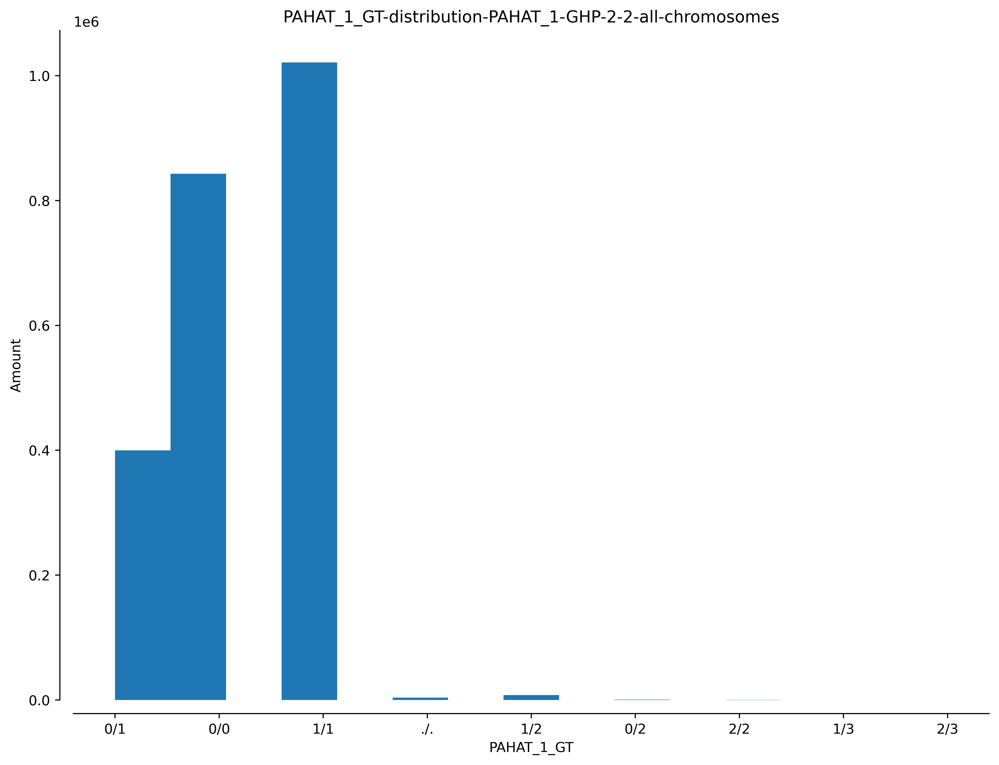

In [26]:
plot_variant_hist(samples, vcf_df_00, 'all', 'PAHAT_1_GT', bins=15)

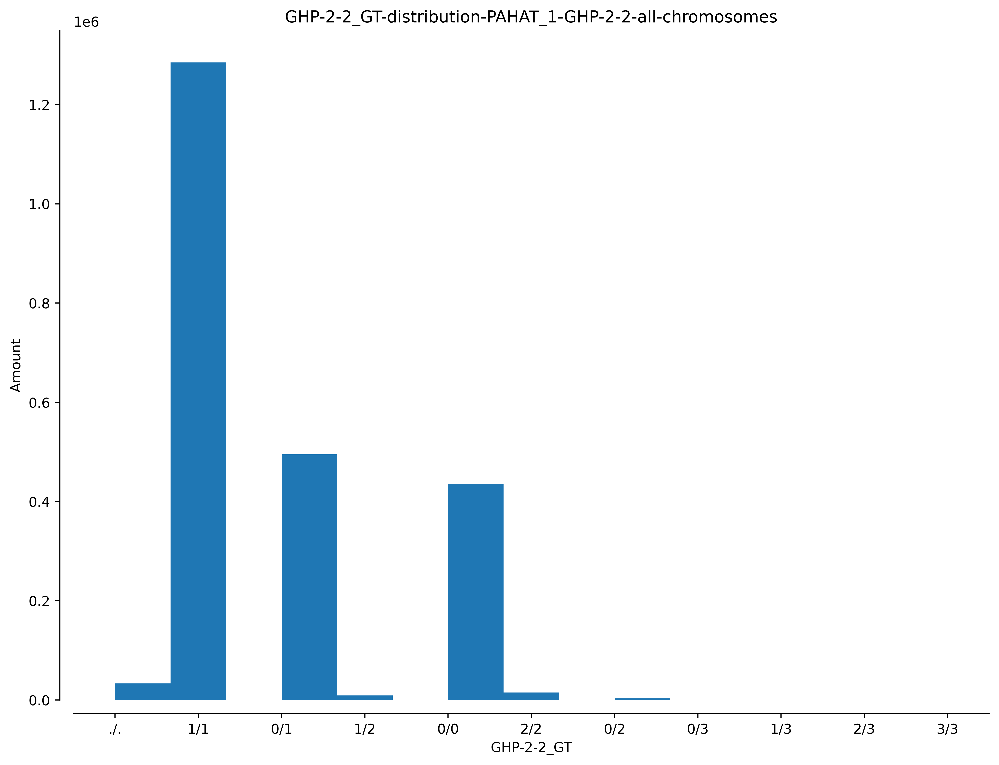

In [27]:
plot_variant_hist(samples, vcf_df_00, 'all', 'GHP-2-2_GT', bins=15)

## <span style="color:blue">PART 2: Cutting Off by Mean±2StdDev Histograms of `DP` Attribute</span>

In [28]:
cutoff_left = vcf_df_00.DP.mean() - (2 * vcf_df_00.DP.std())
cutoff_right = vcf_df_00.DP.mean() + (2 * vcf_df_00.DP.std())

filter_dp = "DP >= %i, DP <= %i" % (cutoff_left, cutoff_right)
print(filter_dp)

vcf_df_01 = filter_vcf(vcf_df_00, filter_dp)
vcf_df_01

DP >= -23, DP <= 150


,CHROM,POS,REF,ALT,QUAL,DP,GHP-2-2_DP,PAHAT_1_DP,PAHAT_2_DP,GHP-2-2_GT,PAHAT_1_GT,PAHAT_2_GT,GHP-2-2_AD,PAHAT_1_AD,PAHAT_2_AD,AN,TYPE
0,NC_012870.2,91,C,A,113.435997,13,-1,5,8,./.,0/1,0/1,./.,2/3,3/5,4,snp
1,NC_012870.2,111,C,A,226.643997,16,-1,6,10,./.,0/1,0/1,./.,2/4,2/8,4,snp
2,NC_012870.2,744,C,A,178.729996,43,8,20,15,1/1,0/0,0/0,0/8,20/0,15/0,6,snp
3,NC_012870.2,871,C,T,499.332001,61,18,28,15,1/1,0/0,0/0,0/18,28/0,15/0,6,snp
4,NC_012870.2,1143,T,G,176.011002,16,9,1,6,1/1,0/0,0/0,0/9,1/0,6/0,6,snp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2217645,NC_012879.2,61191248,GCCA,ACCG,27.908600,71,16,22,33,0/0,0/1,0/1,15/1,18/4,28/5,6,complex
2217646,NC_012879.2,61191286,C,T,13.749700,70,19,20,31,0/0,0/1,0/1,18/1,16/4,27/4,6,snp
2217647,NC_012879.2,61191293,G,C,23.474300,65,17,20,28,0/0,0/1,0/1,16/1,16/4,24/4,6,snp
2217648,NC_012879.2,61233448,GTTTAGGGTTAAGGGT,GTTTTAGGGTT,432.449005,139,15,68,56,0/1,0/1,0/1,9/3,42/16,31/13,6,complex


#### Verify DP Histogram Cutoff Off by Mean±StdDev

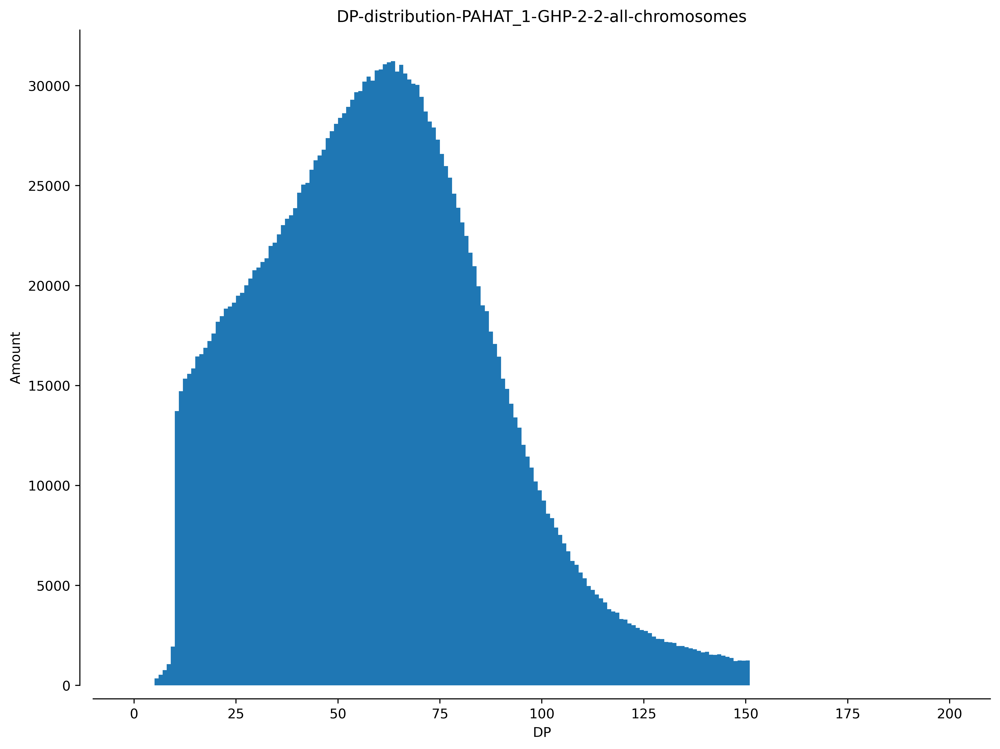

In [29]:
plot_variant_hist(samples, vcf_df_01, 'all', 'DP', bins=200, xmax=200)

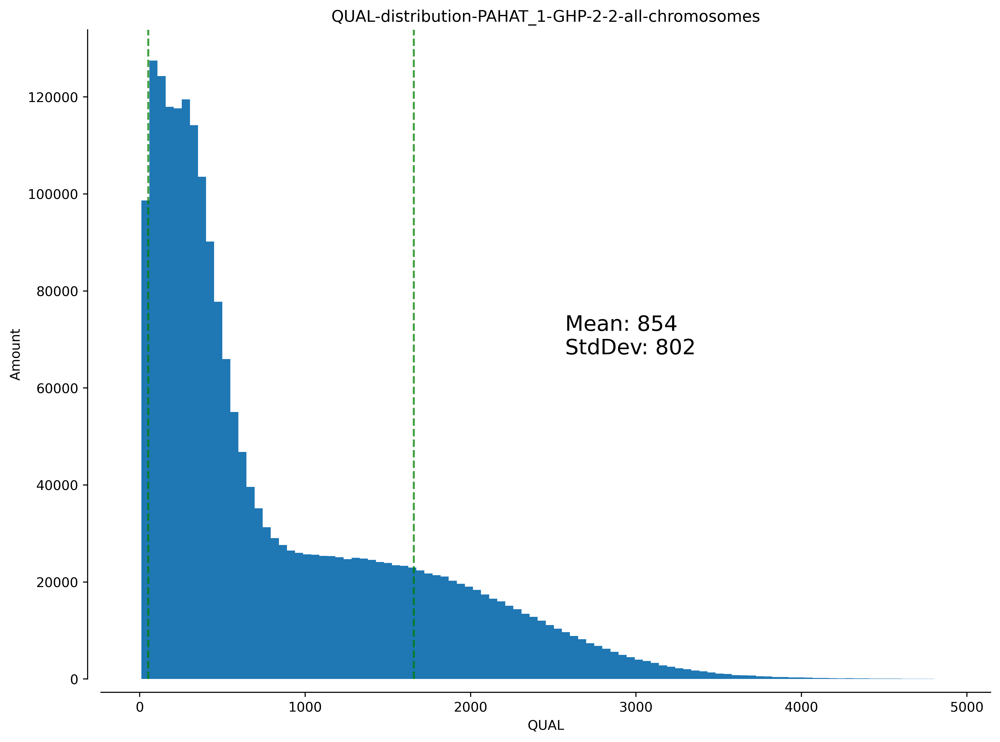

In [30]:
plot_variant_hist(samples, vcf_df_01, 'all', 'QUAL', bins=100, MSTD=True)

#### Contingency Table After DP Cutoff by Mean±StdDev

In [31]:
contingency_table_2 = contingency_table(samples, vcf_df_01, 'all')


Contingency Table - Chromosome all

                 GHP-2-2_GT                       
                        0/0     0/1     1/1  other
PAHAT_1_GT 0/0         7349  206016  618142  67287
           0/1       110174  191367   40272  67287
           1/1       306772   53835  616436  67287
           other      67287   67287   67287  67287


#### GT Plot After DP Cutoff by Mean±StdDev

In [32]:
# plt.close('all')
# GTplot(samples, vcf_df_01, chrom_len_00)

#### Histogram 'GT' Attribute after DP Cutoff

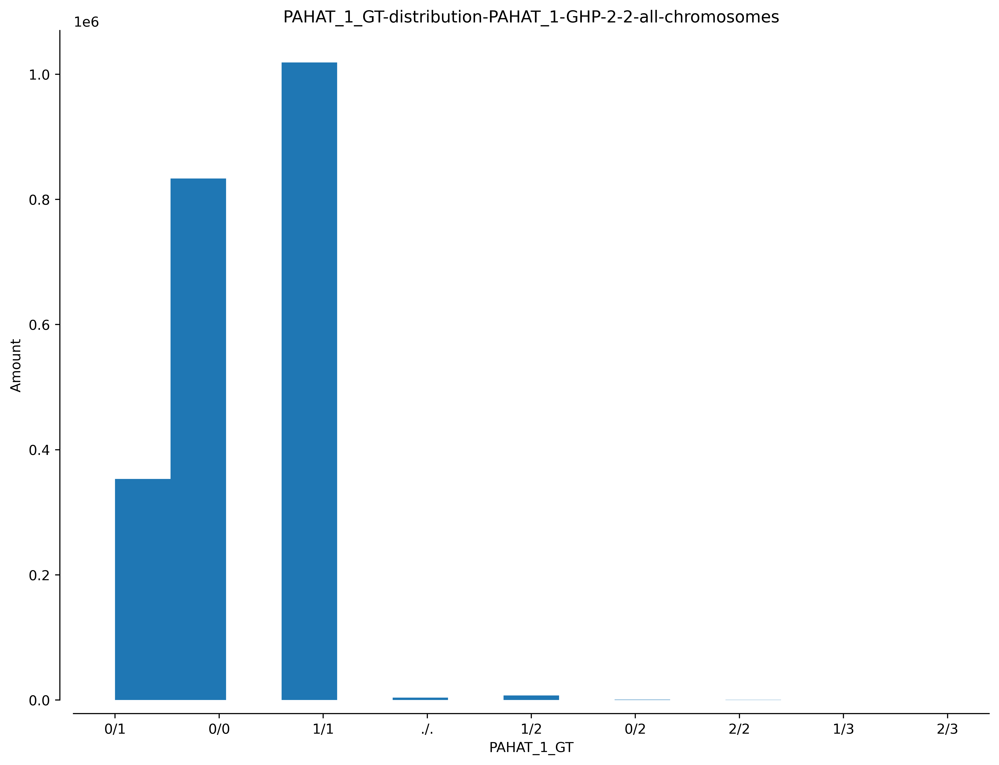

In [33]:
plot_variant_hist(samples, vcf_df_01, 'all', 'PAHAT_1_GT', bins=15)

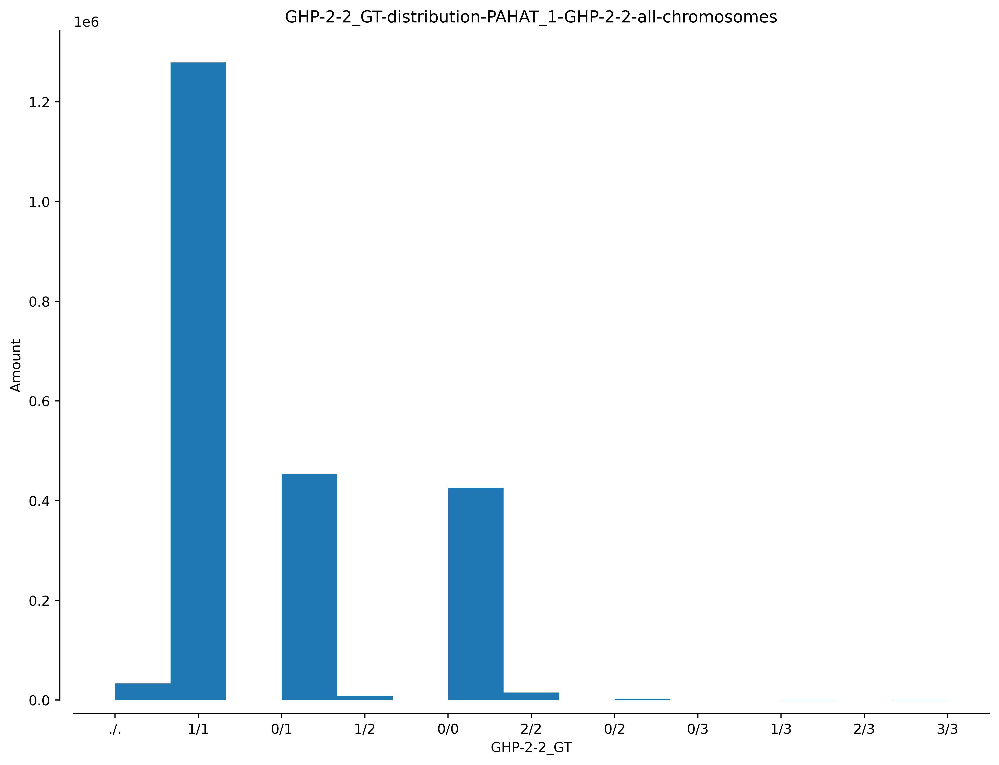

In [34]:
plot_variant_hist(samples, vcf_df_01, 'all', 'GHP-2-2_GT', bins=15)

## <span style="color:blue">PART 3: Extract `ins` and `del` from `TYPE` Attribute</span>

#### Extract `ins` and `del`  `TYPE` Attribute

In [35]:
extract_type = "TYPE != snp, TYPE != complex, TYPE != mnp"
vcf_df_02 = filter_vcf(vcf_df_01, extract_type)
vcf_df_02

,CHROM,POS,REF,ALT,QUAL,DP,GHP-2-2_DP,PAHAT_1_DP,PAHAT_2_DP,GHP-2-2_GT,PAHAT_1_GT,PAHAT_2_GT,GHP-2-2_AD,PAHAT_1_AD,PAHAT_2_AD,AN,TYPE
0,NC_012870.2,1639,ACCCCCCCAGCA,ACCCCCCAGCA,151.621002,42,13,20,9,0/1,0/0,0/0,5/8,20/0,9/0,6,del
1,NC_012870.2,2881,GTTTTTTTGTCG,GTTTTTTTTGTCG,21.944700,64,21,21,22,0/1,0/0,0/0,16/5,21/0,22/0,6,ins
2,NC_012870.2,3806,ATTTTTTTTACA,ATTTTTTTTTACA,63.013802,35,21,9,5,0/1,0/0,0/0,15/6,9/0,5/0,6,ins
3,NC_012870.2,4512,TATTTCCCACACAAACCACACTCACCCGCTAAAGTGAGCTACAGAT...,TA,157.518005,49,11,28,10,1/1,0/0,0/0,0/11,27/1,9/1,6,del
4,NC_012870.2,10162,TGGGGGCA,TGGGGGGCA,1030.800049,101,35,29,37,1/1,0/0,0/0,0/35,29/0,36/0,6,ins
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
254720,NC_012879.2,60955570,TAAAAAAAAAAAAGAAAAGAAAGGGGGAGT,TAAAAAAAAAGAAAAGAAAGGGGGAGT,124.903000,22,3,8,11,0/0,0/1,0/1,3/0,1/7,8/3,6,del
254721,NC_012879.2,60989473,GATACCCAAA,GA,98.093002,40,5,18,17,0/0,0/1,0/1,5/0,13/5,13/4,6,del
254722,NC_012879.2,61137974,ATTTTTTTAGA,ATTTTTTTTAGA,284.002014,89,27,32,30,0/1,0/1,0/1,12/15,27/5,25/5,6,ins
254723,NC_012879.2,61160465,GCG,GGGCCCGGCACG,299.227997,78,20,34,24,0/0,0/1,0/1,15/1,26/8,14/10,6,ins


#### TYPE `ins` and `del` Histogram Verification

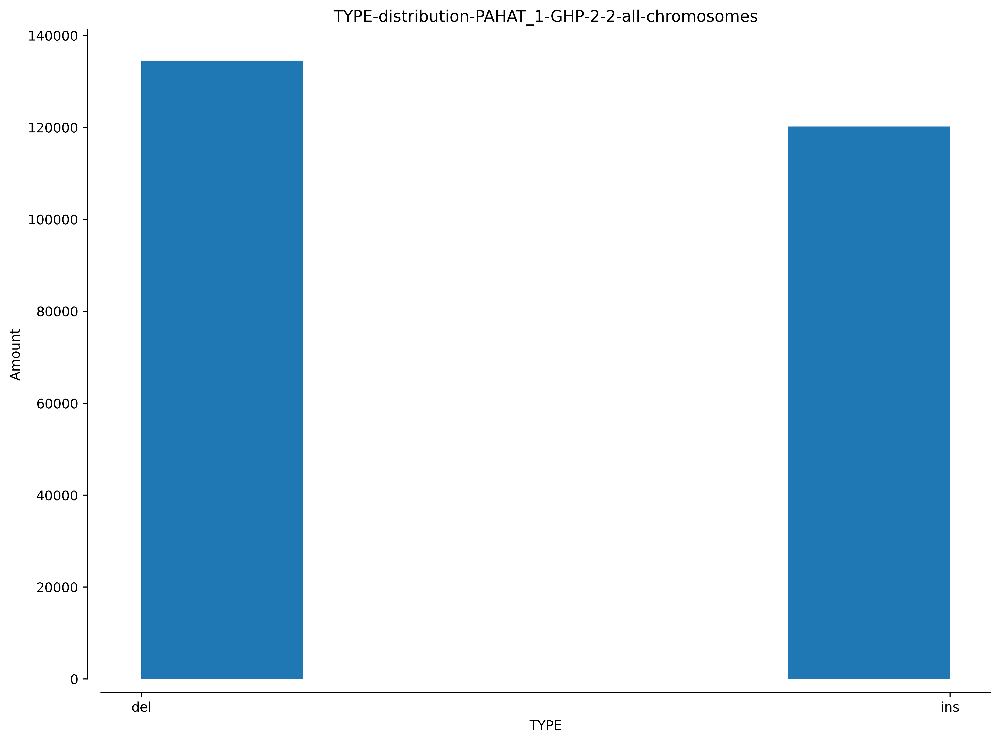

In [36]:
plot_variant_hist(samples, vcf_df_02, 'all', 'TYPE', bins=5)

#### Contingency Table - `ins` and `del` TYPE only

In [37]:
contingency_table_3 = contingency_table(samples, vcf_df_02, 'all')


Contingency Table - Chromosome all

                 GHP-2-2_GT                     
                        0/0    0/1    1/1  other
PAHAT_1_GT 0/0          305  15850  69051  13418
           0/1         8133   9738   4646  13418
           1/1        48313   7313  77958  13418
           other      13418  13418  13418  13418


#### GT Plot - `ins` and `del` TYPE only

In [38]:
# plt.close('all')
# GTplot(samples, vcf_df_02, chrom_len_00)

#### Histograms - DP, QUAL, and GT Attributes after TYPE Filtering

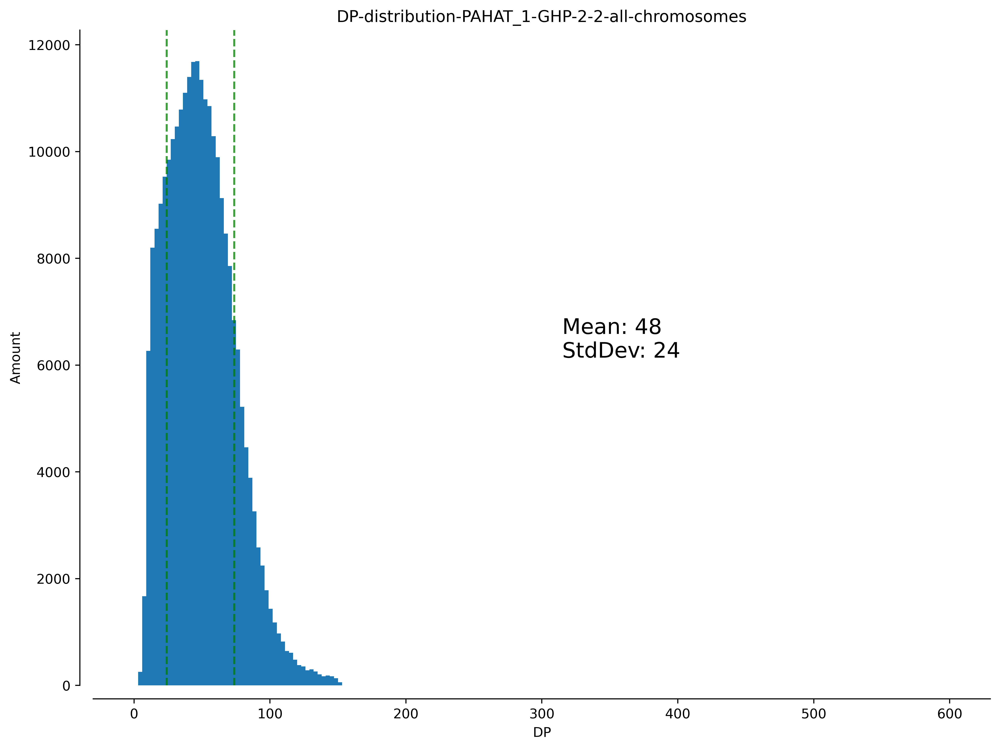

In [39]:
plot_variant_hist(samples, vcf_df_02, 'all', 'DP', bins=200, MSTD=True, xmax=600)

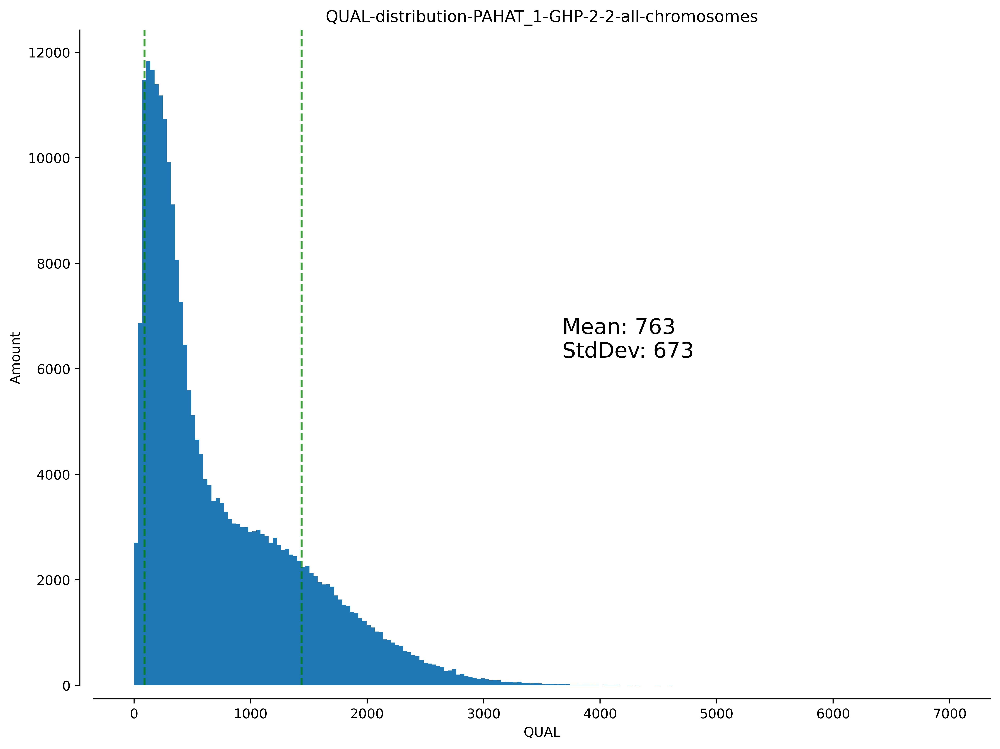

In [40]:
plot_variant_hist(samples, vcf_df_02, 'all', 'QUAL', bins=200,  MSTD=True, xmax=7000)

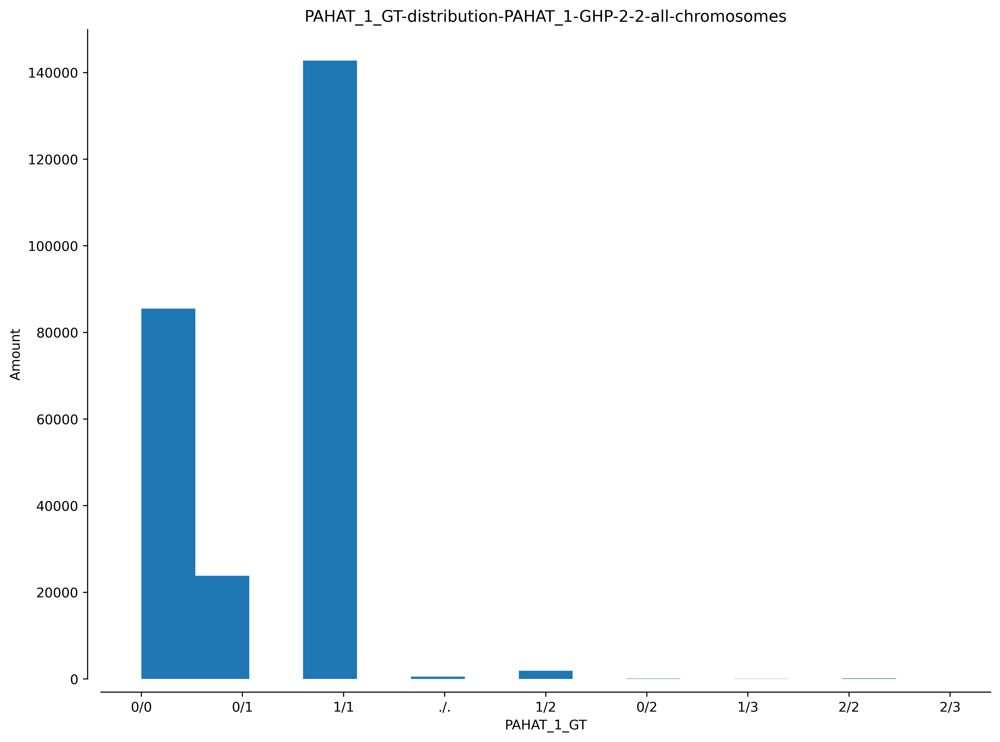

In [41]:
plot_variant_hist(samples, vcf_df_02, 'all', 'PAHAT_1_GT', bins=15)

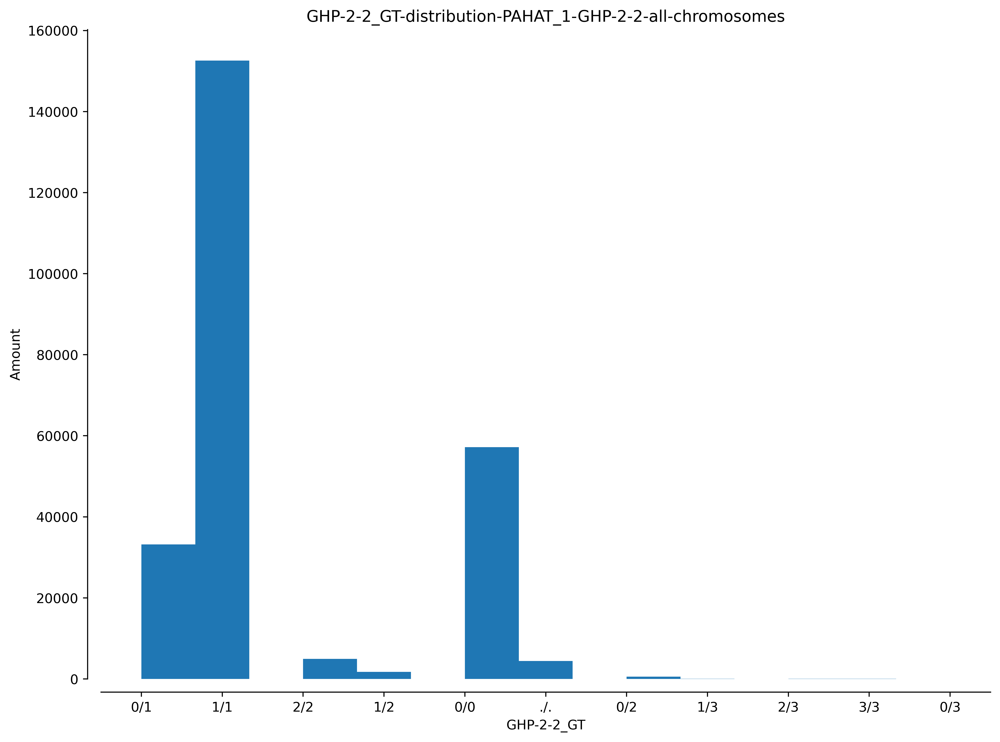

In [42]:
plot_variant_hist(samples, vcf_df_02, 'all', 'GHP-2-2_GT', bins=15)

## <span style="color:blue"> PART 4: Cutting Off by Mean±StdDev Histograms of `QUAL` Attribute</span>

In [43]:
# cutoff_left = vcf_df_02.QUAL.mean() - vcf_df_02.QUAL.std()
# cutoff_right = vcf_df_02.QUAL.mean() + vcf_df_02.QUAL.std()

# filter_qual = "QUAL >= %i, QUAL <= %i" % (cutoff_left, cutoff_right)
# print(filter_qual)

# vcf_df_03 = filter_vcf(vcf_df_02, filter_qual)
# vcf_df_03

#### Verify `DP` and `QUAL` Histograms after `QUAL` Cutoff Off by Mean±StdDev

In [44]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'DP', bins=200, xmax=200)

In [45]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'QUAL', bins=100, xmax=3500)

#### Contingency Table After QUAL Cutoff by Mean±StdDev

In [46]:
# contingency_table_4 = contingency_table(samples, vcf_df_03, 'all')
# contingency_table_4

#### GT Plot After QUAL Cutoff by Mean±StdDev

In [47]:
# plt.close('all')
# GTplot(samples, vcf_df_03, chrom_len_00)

#### Histograms after QUAL Cutoff by Mean±StdDev

In [48]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'PAHAT_1_GT', bins=9)

In [49]:
# plot_variant_hist(samples, vcf_df_03, 'all', 'GHP-2-2_GT', bins=9)

## <span style="color:blue"> PART 5: Filtering GTs 0/0, 1/1, 'Other' </span>

#### Filter out where samples GTs are the same (0/0, 1/1) and have 'Other'

In [50]:
PAHAT_gts_filter = "PAHAT_1_GT != ./., PAHAT_1_GT != 0/2, PAHAT_1_GT != 1/2, PAHAT_1_GT != 2/2, PAHAT_1_GT != 0/3, PAHAT_1_GT != 1/3, PAHAT_1_GT != 2/3, PAHAT_1_GT != 3/3"
vcf_df_04 = filter_vcf(vcf_df_02, PAHAT_gts_filter)

GHP_gts_filter = "GHP-2-2_GT != ./., GHP-2-2_GT != 0/2, GHP-2-2_GT != 1/2, GHP-2-2_GT != 2/2, GHP-2-2_GT != 0/3, GHP-2-2_GT != 1/3, GHP-2-2_GT != 2/3, GHP-2-2_GT != 3/3"
vcf_df_04 = filter_vcf(vcf_df_04, GHP_gts_filter)

genotypes = ['0/0', '1/1']
for genotype in genotypes:
    vcf_df_04 = filter_similar_gt(samples, vcf_df_04, genotype)

vcf_df_04

,CHROM,POS,REF,ALT,QUAL,DP,GHP-2-2_DP,PAHAT_1_DP,PAHAT_2_DP,GHP-2-2_GT,PAHAT_1_GT,PAHAT_2_GT,GHP-2-2_AD,PAHAT_1_AD,PAHAT_2_AD,AN,TYPE
0,NC_012870.2,1639,ACCCCCCCAGCA,ACCCCCCAGCA,151.621002,42,13,20,9,0/1,0/0,0/0,5/8,20/0,9/0,6,del
1,NC_012870.2,2881,GTTTTTTTGTCG,GTTTTTTTTGTCG,21.944700,64,21,21,22,0/1,0/0,0/0,16/5,21/0,22/0,6,ins
2,NC_012870.2,3806,ATTTTTTTTACA,ATTTTTTTTTACA,63.013802,35,21,9,5,0/1,0/0,0/0,15/6,9/0,5/0,6,ins
3,NC_012870.2,4512,TATTTCCCACACAAACCACACTCACCCGCTAAAGTGAGCTACAGAT...,TA,157.518005,49,11,28,10,1/1,0/0,0/0,0/11,27/1,9/1,6,del
4,NC_012870.2,10162,TGGGGGCA,TGGGGGGCA,1030.800049,101,35,29,37,1/1,0/0,0/0,0/35,29/0,36/0,6,ins
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163039,NC_012879.2,60955570,TAAAAAAAAAAAAGAAAAGAAAGGGGGAGT,TAAAAAAAAAGAAAAGAAAGGGGGAGT,124.903000,22,3,8,11,0/0,0/1,0/1,3/0,1/7,8/3,6,del
163040,NC_012879.2,60989473,GATACCCAAA,GA,98.093002,40,5,18,17,0/0,0/1,0/1,5/0,13/5,13/4,6,del
163041,NC_012879.2,61137974,ATTTTTTTAGA,ATTTTTTTTAGA,284.002014,89,27,32,30,0/1,0/1,0/1,12/15,27/5,25/5,6,ins
163042,NC_012879.2,61160465,GCG,GGGCCCGGCACG,299.227997,78,20,34,24,0/0,0/1,0/1,15/1,26/8,14/10,6,ins


#### Contingency Table after GT Filtering

In [51]:
contingency_table_5 = contingency_table(samples, vcf_df_04, 'all')


Contingency Table - Chromosome all

                 GHP-2-2_GT                    
                        0/0    0/1    1/1 other
PAHAT_1_GT 0/0            0  15850  69051     0
           0/1         8133   9738   4646     0
           1/1        48313   7313      0     0
           other          0      0      0     0


#### GT Plot after GT Filtering

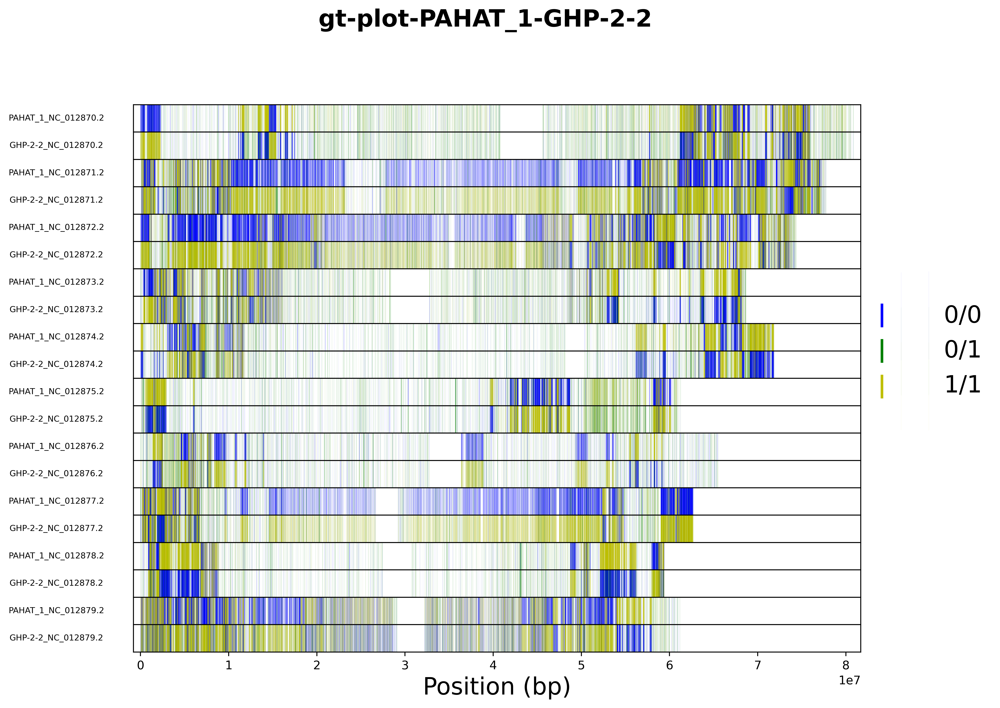

In [52]:
plt.close('all')
GTplot(samples, vcf_df_04, chrom_len_00)

#### Histograms GT after GT Filtering 

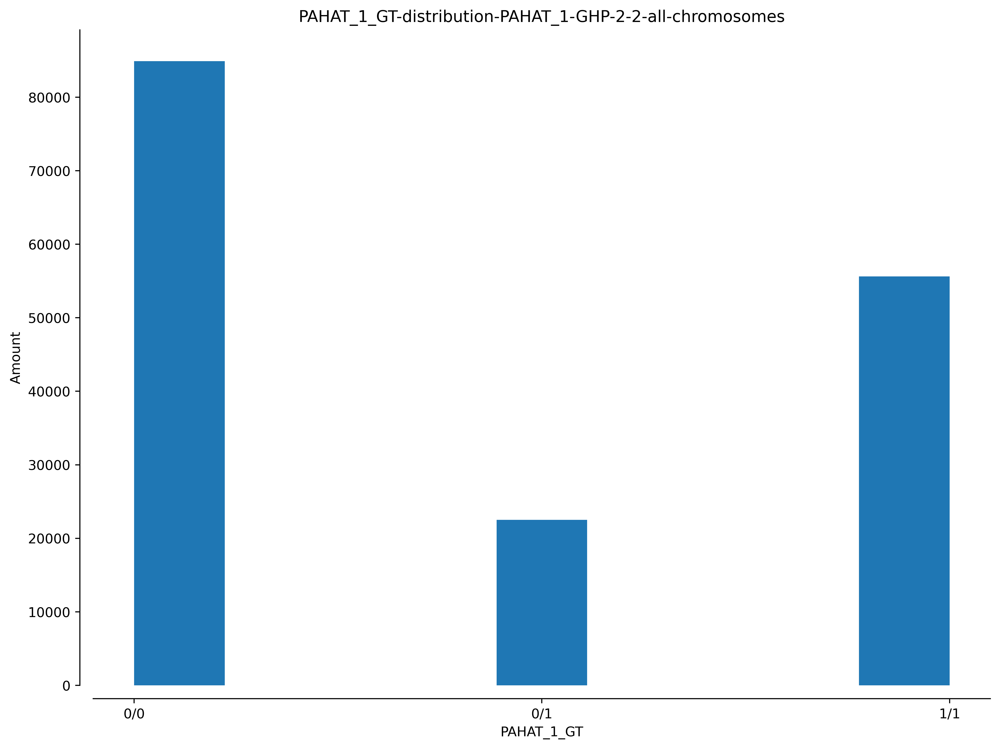

In [53]:
plot_variant_hist(samples, vcf_df_04, 'all', 'PAHAT_1_GT', bins=9)

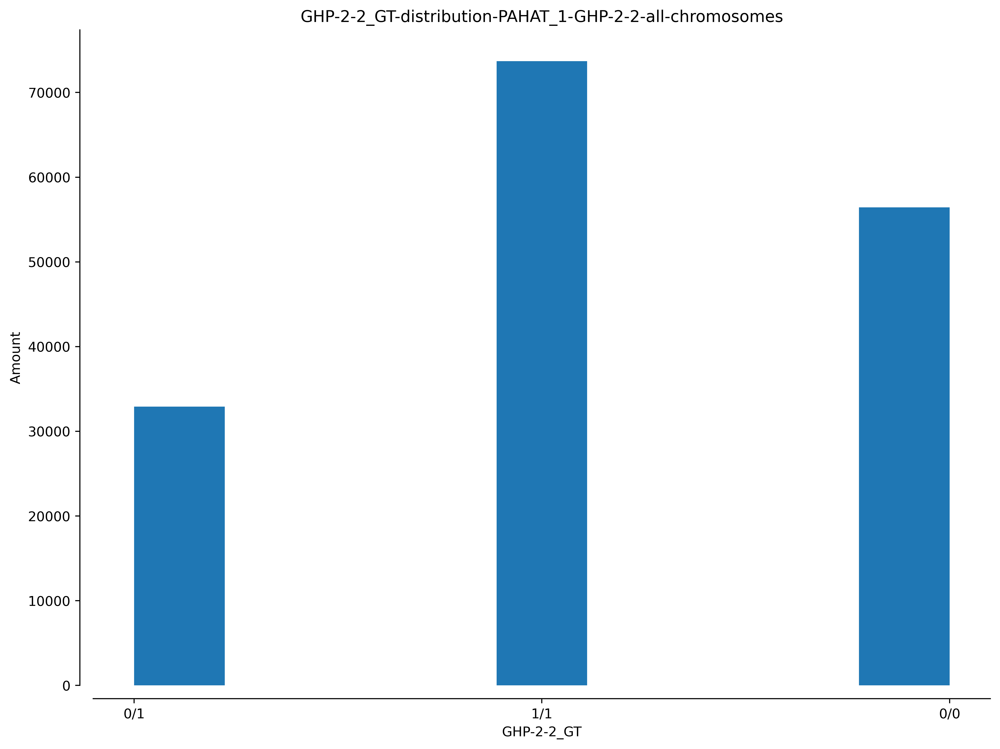

In [54]:
plot_variant_hist(samples, vcf_df_04, 'all', 'GHP-2-2_GT', bins=9)

## <span style="color:blue"> PART 6: Stacked Bar Plots</span>

In [59]:
ct_guide()

Mutant              
                    0/0 0/1 1/1 other
Progenitor 0/0        a   b   c      
           0/1        d   e   f      
           1/1        g   h   i      
           other                    j

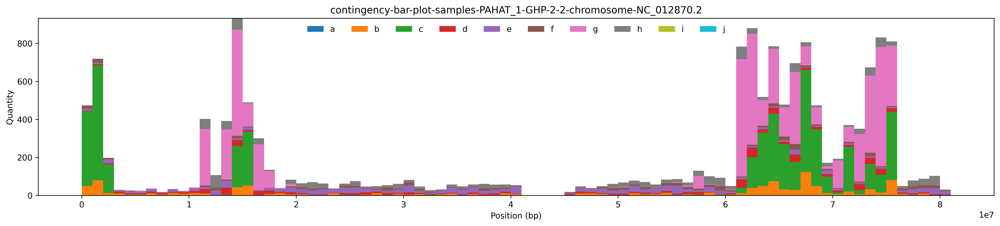

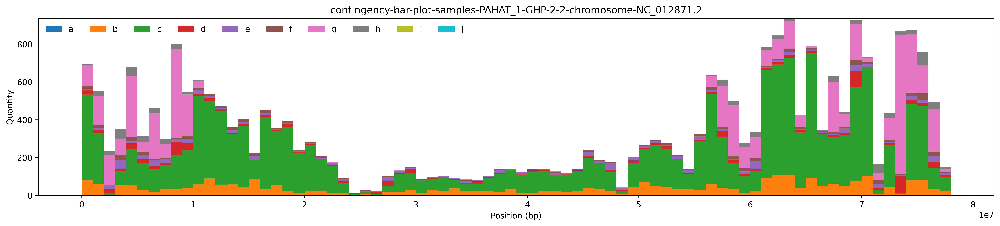

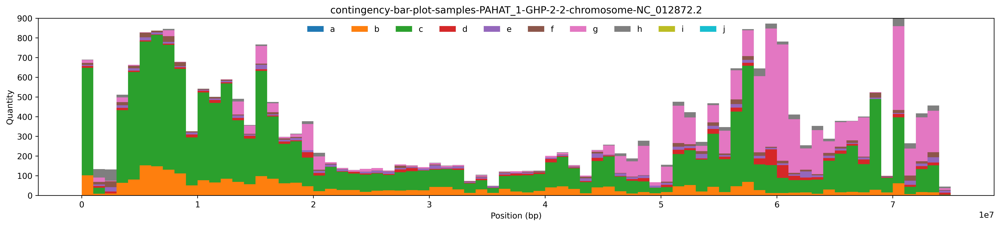

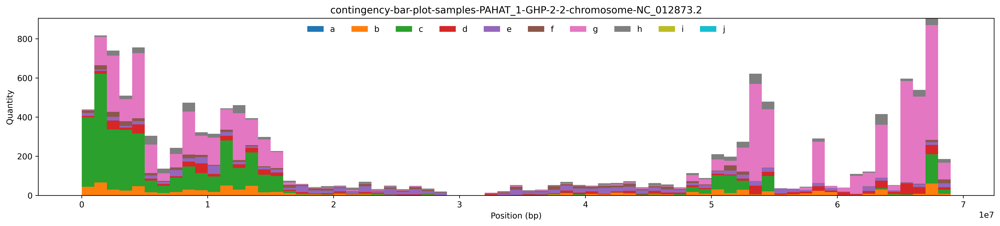

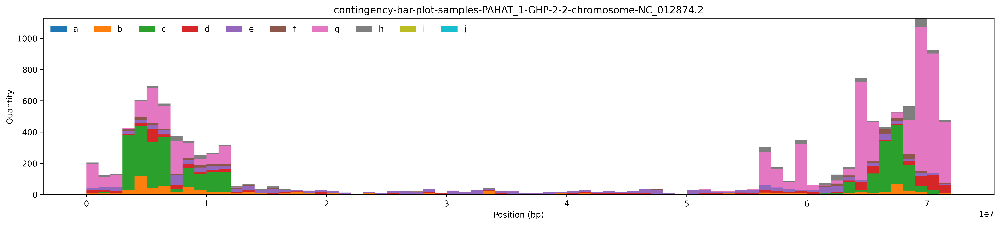

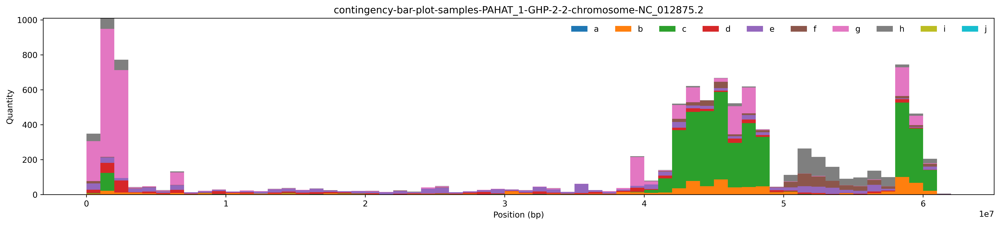

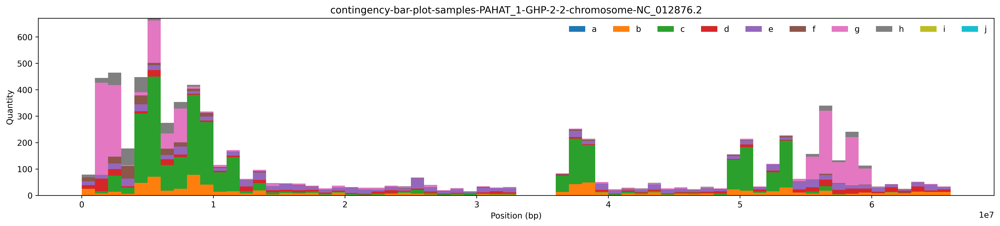

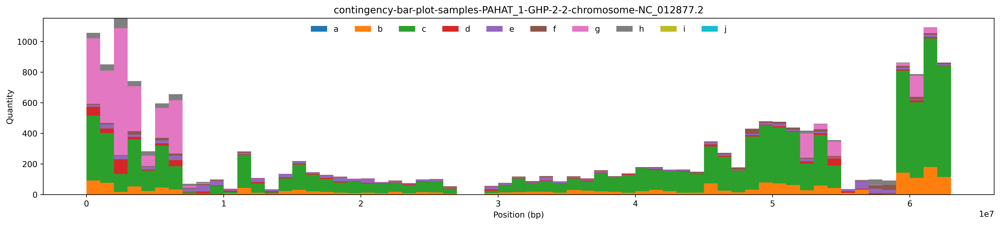

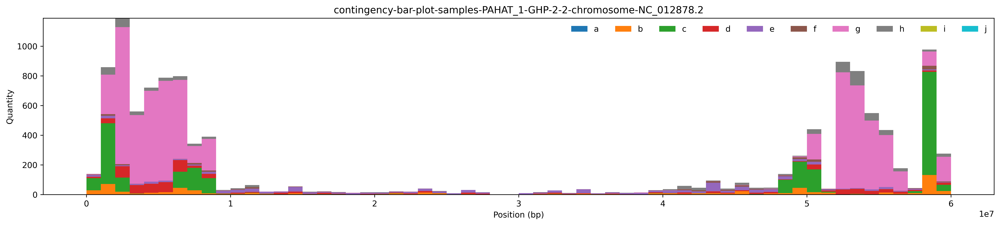

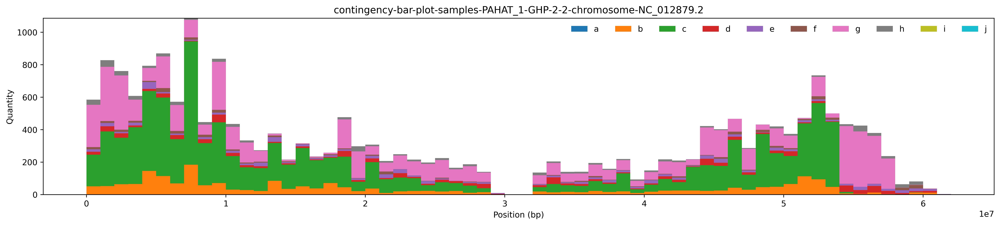

In [55]:
plt.close('all')
window_size = 1000000
CTbarPlots(samples, vcf_df_04, chrom_len_00, window_size)

## <span style="color:blue"> PART 7: Bar Plots per Chromosome</span>

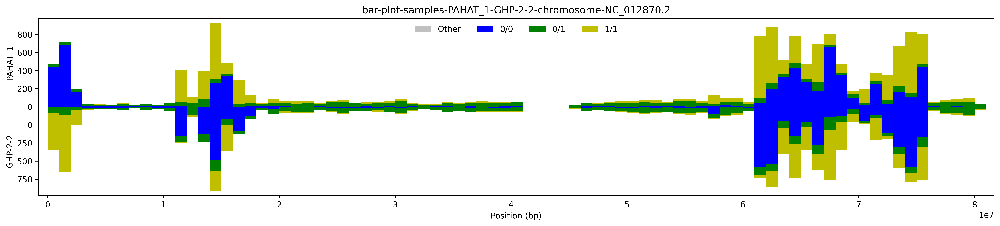

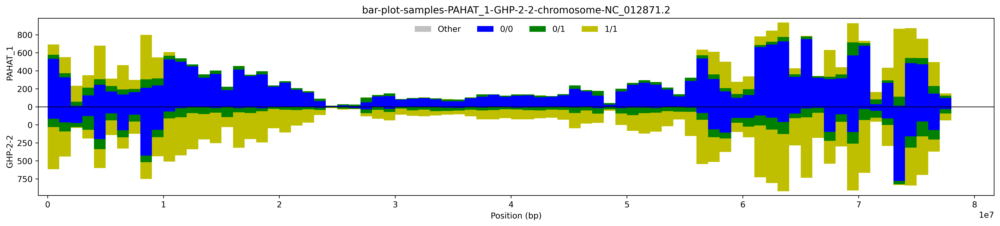

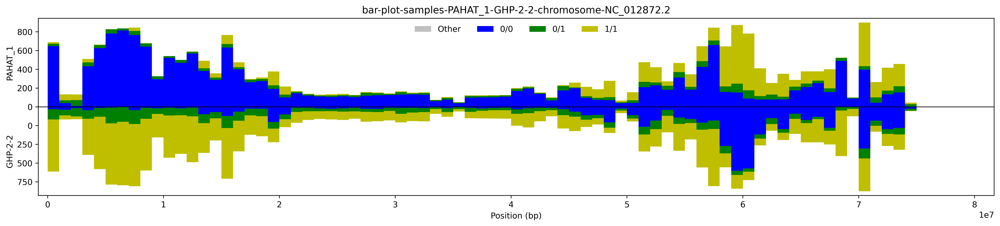

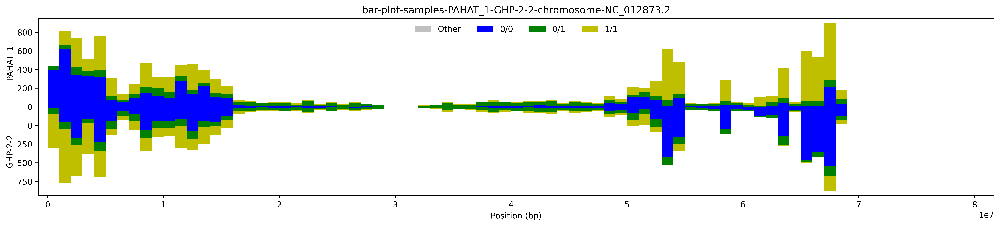

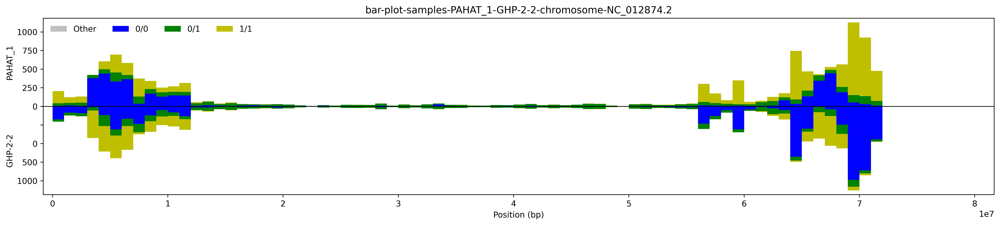

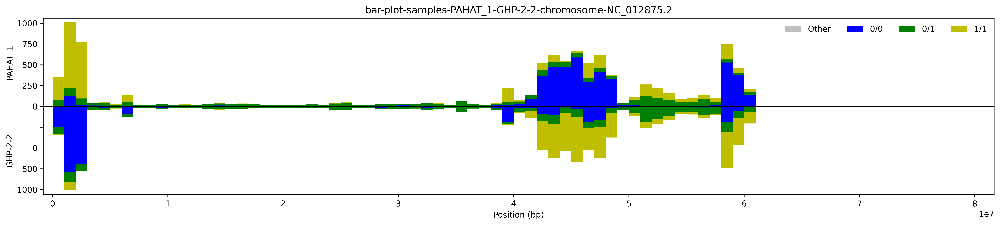

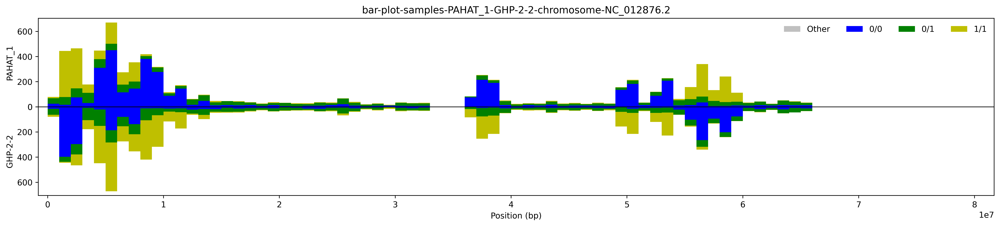

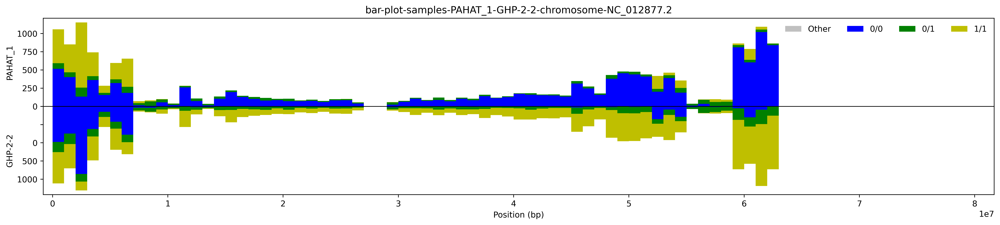

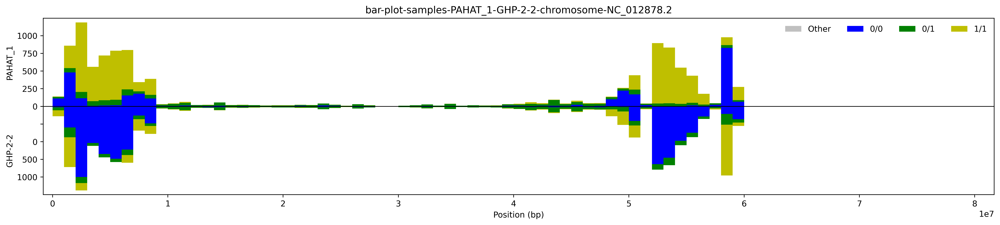

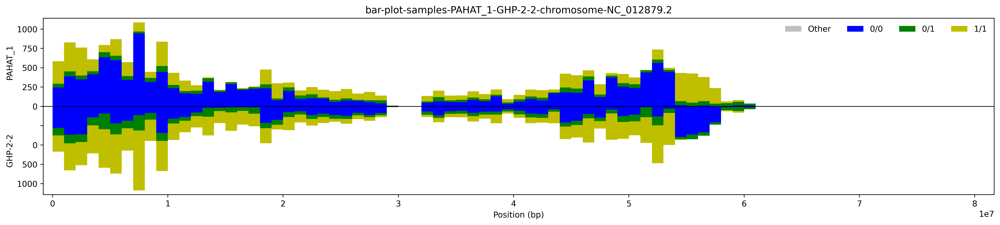

In [56]:
# suppress all the warnings from the inverted tickes of bar plots
import warnings
warnings.filterwarnings('ignore')

plt.close('all')
GTbarPlots(samples, vcf_df_04, chrom_len_00, window_size)

## <span style="color:blue"> PART 8: GT Plots per Chromosome</span>

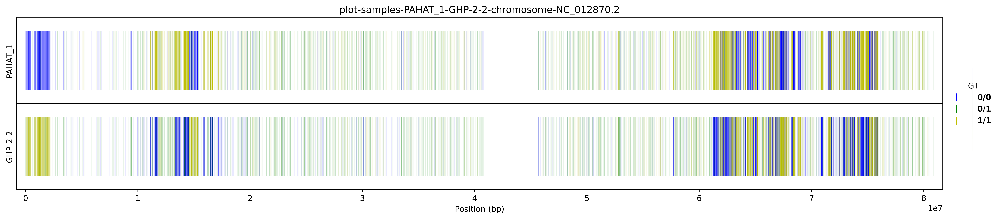

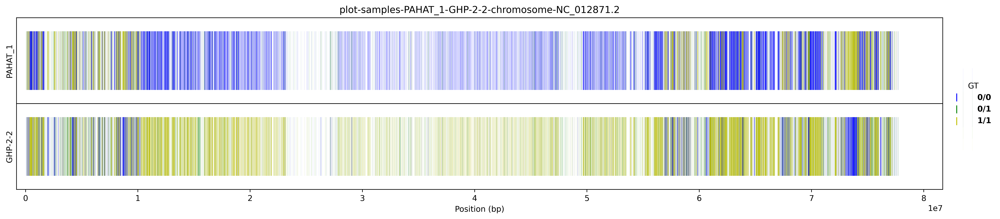

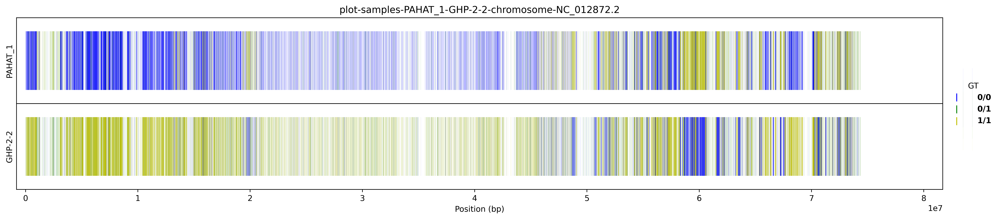

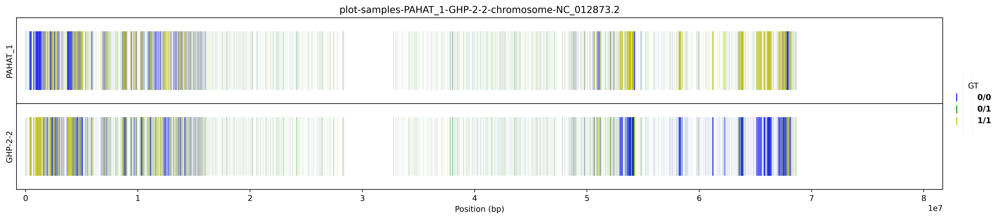

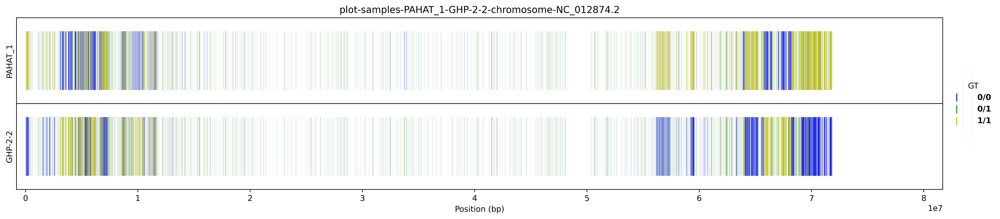

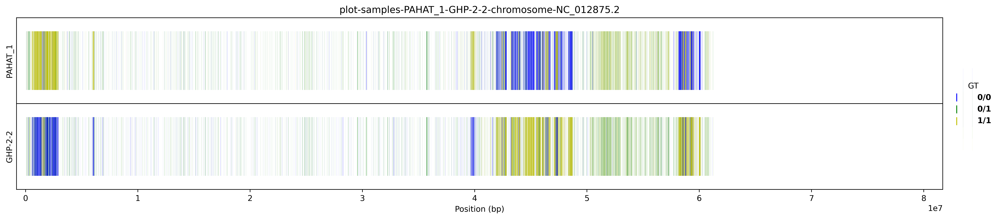

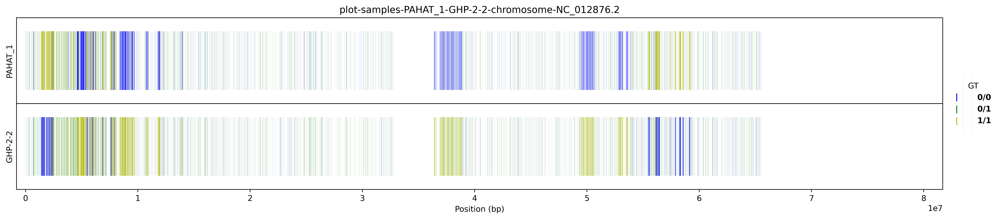

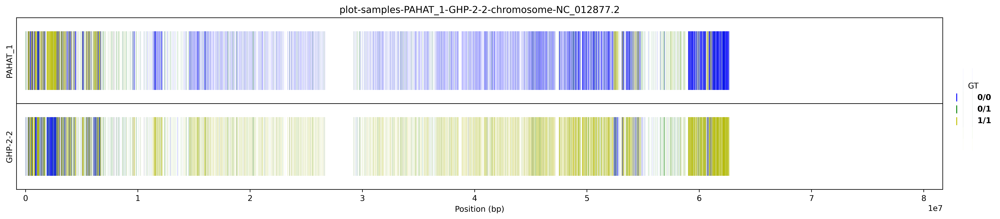

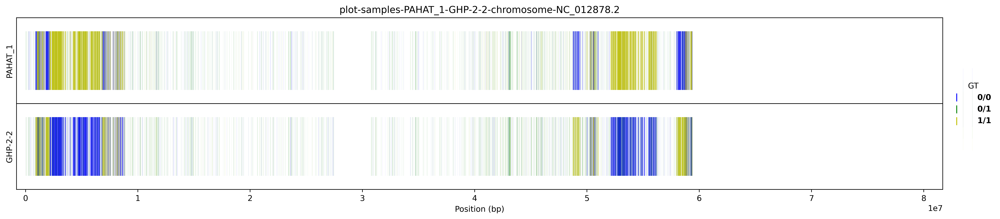

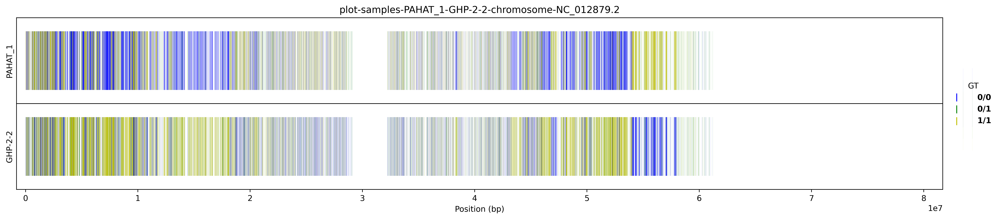

In [57]:
plt.close('all')
GTplots(samples, vcf_df_04, chrom_len_00)

## <span style="color:blue"> PART 9: Contingency Table per Chromosome</span>

In [58]:
import dataframe_image as dfi

for chromosome in chrom_len_00.index:
    chromosome_df = vcf_df_04[ vcf_df_04.CHROM == chromosome ]
    
    # reset chromosome_df indexes for contingency table
    chromosome_df.reset_index(inplace=True, drop=True)
    chromosome_ct = contingency_table(samples, chromosome_df, chromosome)


Contingency Table - Chromosome NC_012870.2

                 GHP-2-2_GT                  
                        0/0   0/1   1/1 other
PAHAT_1_GT 0/0            0  1179  4670     0
           0/1          871  1278   635     0
           1/1         5900  1419     0     0
           other          0     0     0     0

Contingency Table - Chromosome NC_012871.2

                 GHP-2-2_GT                   
                        0/0   0/1    1/1 other
PAHAT_1_GT 0/0            0  3090  15467     0
           0/1         1039  1010    656     0
           1/1         5268   733      0     0
           other          0     0      0     0

Contingency Table - Chromosome NC_012872.2

                 GHP-2-2_GT                   
                        0/0   0/1    1/1 other
PAHAT_1_GT 0/0            0  3002  14417     0
           0/1          888   777    638     0
           1/1         5683   685      0     0
           other          0     0      0     0

Contingency Table - Chro